一，实践：Section 3.6 Lab: Linear Regression

In [1]:
# 先加载两个基本数据集
library(MASS)
library(ISLR2)


Attaching package: ‘ISLR2’


The following object is masked from ‘package:MASS’:

    Boston




In [ ]:
# ISLR2包含Boston数据集，记录了波士顿506个人口普查区的房价中位数（medv），我们将使用12个预测指标来预测medv，如rm（每栋房子的平均房间数）、age（1940年之前建造的自住单元的比例）和lstat（社会经济地位较低的家庭的百分比）

head(Boston)

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv
,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.00632,18,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,4.98,24.0
2,0.02731,0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,9.14,21.6
3,0.02729,0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,4.03,34.7
4,0.03237,0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,2.94,33.4
5,0.06905,0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,5.33,36.2
6,0.02985,0,2.18,0,0.458,6.430,58.7,6.0622,3,222,18.7,5.21,28.7


我们将首先使用lm（）函数来拟合一个简单的线性回归lm（）模型，
其中medv作为响应变量，lstat作为预测器。基本语法是lm(y ~ x, data)，其中y是响应，x是预测，data是保存这两个变量的数据集。

In [5]:
lm.fit <- lm(medv ~ lstat, data = Boston)

# 上面是正常写法，下面是使用attach函数的写法
# attach(Boston) 将Boston数据集中的变量放入到搜索路径中
# lm.fit <- lm(medv ~ lstat)

打印lm.fit的话会输出一些关于模型的基本信息。

要获得更详细的信息，我们使用summary（lm.fit），这为我们提供了系数的P值和标准误差SE，以及模型的R2统计量和F统计量

In [6]:
lm.fit


Call:
lm(formula = medv ~ lstat, data = Boston)

Coefficients:
(Intercept)        lstat  
      34.55        -0.95  


In [7]:
summary(lm.fit)


Call:
lm(formula = medv ~ lstat, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-15.168  -3.990  -1.318   2.034  24.500 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 34.55384    0.56263   61.41   <2e-16 ***
lstat       -0.95005    0.03873  -24.53   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.216 on 504 degrees of freedom
Multiple R-squared:  0.5441,	Adjusted R-squared:  0.5432 
F-statistic: 601.6 on 1 and 504 DF,  p-value: < 2.2e-16


In [ ]:
# 访问lm对象的各个部分
names(x = lm.fit) #拟合模型的各个部分
coef(lm.fit) #所估计的系数
confint(lm.fit) #所估计的系数的置信区间

[1] "coefficients"  "residuals"     "effects"       "rank"         
 [5] "fitted.values" "assign"        "qr"            "df.residual"  
 [9] "xlevels"       "call"          "terms"         "model"

(Intercept)       lstat 
 34.5538409  -0.9500494

,2.5 %,97.5 %
(Intercept),33.448457,35.6592247
lstat,-1.026148,-0.8739505


对于给定的lstat指，可以使用predict函数生成medv预测值的置信区间和预测区间

In [12]:
predict(lm.fit, data.frame(lstat = (c(5, 10, 15))),interval = "confidence") #预测值和置信区间
predict(lm.fit, data.frame(lstat = (c(5, 10, 15))),interval = "prediction") #预测值和预测区间

,fit,lwr,upr
1,29.80359,29.00741,30.59978
2,25.05335,24.47413,25.63256
3,20.30310,19.73159,20.87461


,fit,lwr,upr
1,29.80359,17.565675,42.04151
2,25.05335,12.827626,37.27907
3,20.30310,8.077742,32.52846


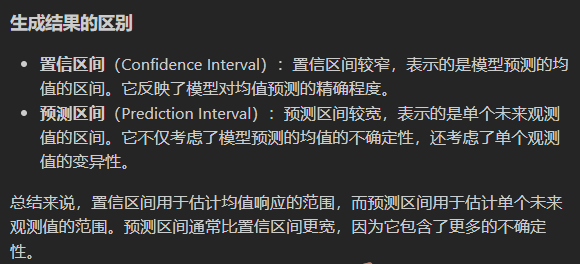
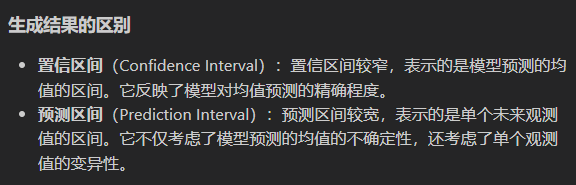
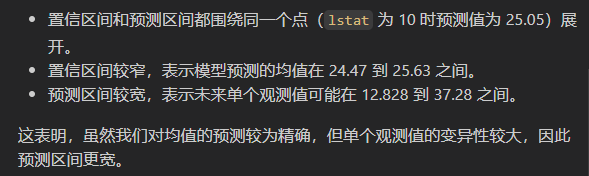

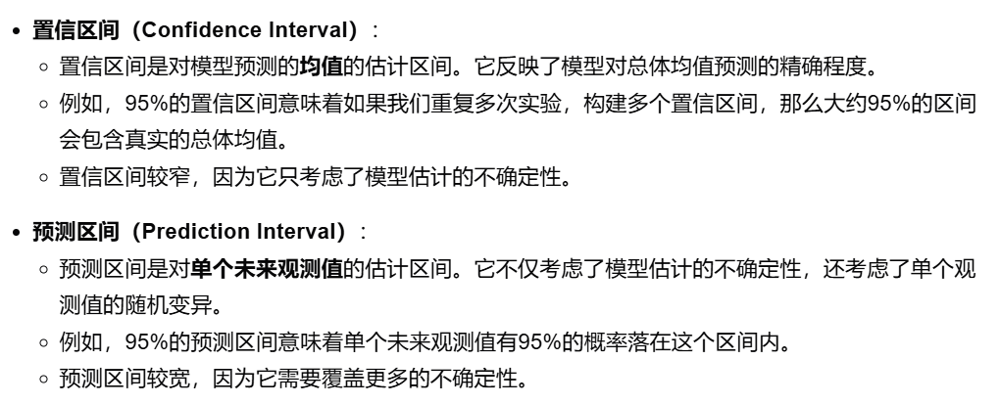

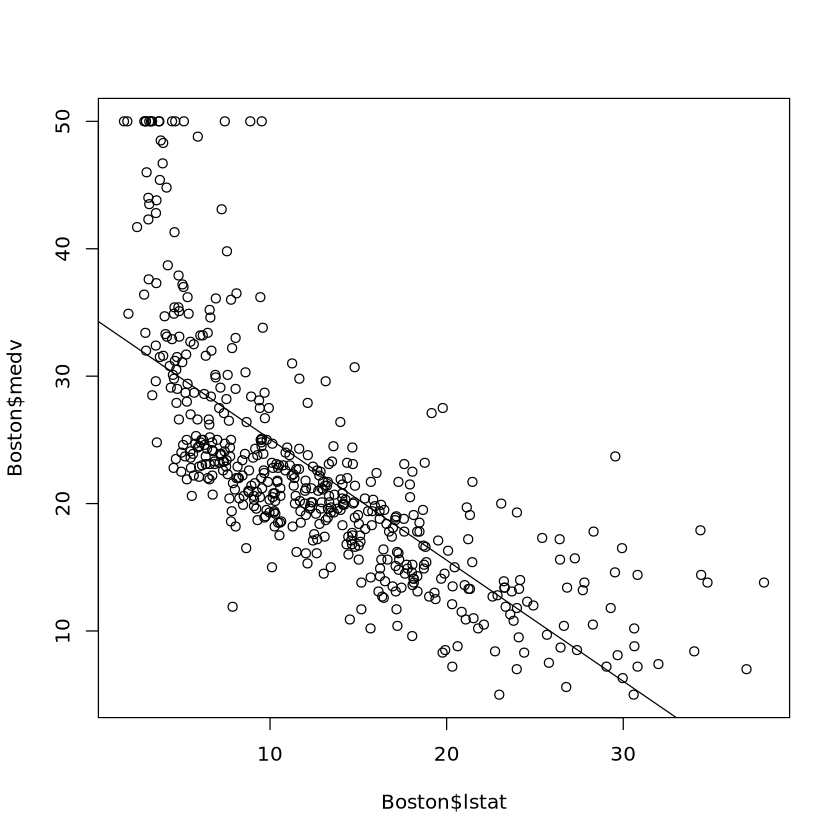

In [ ]:
# 使用plot（）和abline（）函数绘制medv和lstat以及最小二乘回归线
plot(Boston$lstat, Boston$medv)
# 或者attach(Boston)之后直接使用plot(lstat, medv)
abline(lm.fit)

# lstat与medv之间存在一定的非线性关系

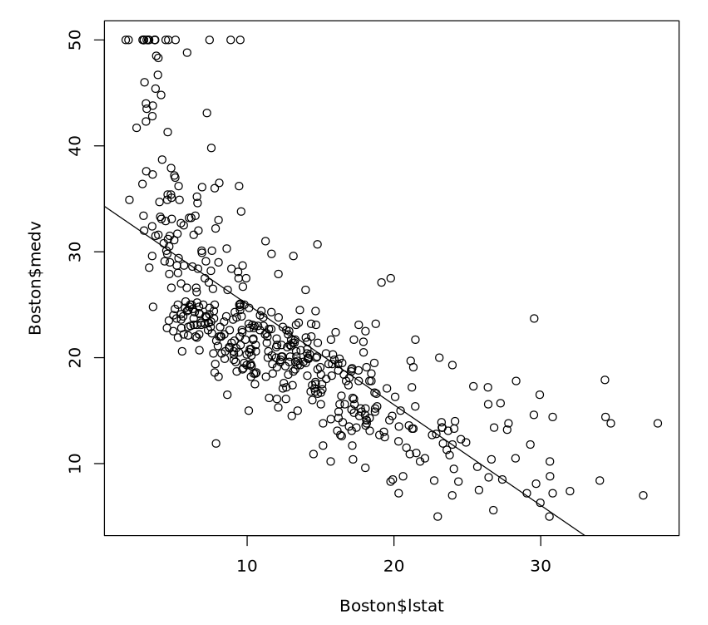

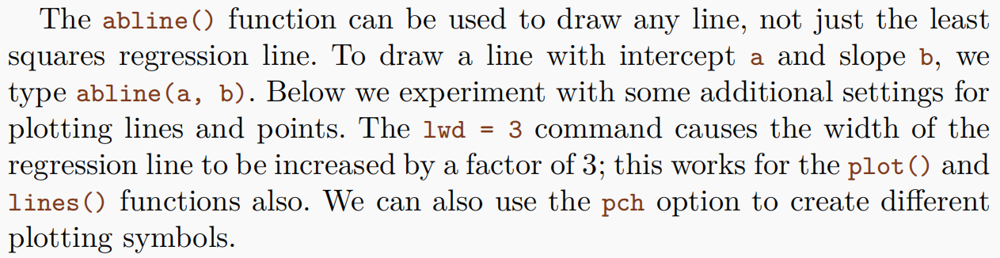

abline（）函数可以用来绘制任何直线，而不仅仅是最小二乘回归直线。

为了绘制截距为a、斜率为b的直线，我们输入abline（a, b）。

下面我们对绘制直线和点进行一些额外的设置。lwd = 3命令使回归线的宽度增加3倍；这也适用于plot（）和lines（）函数。我们也可以使用pch选项来创建不同的绘图符号

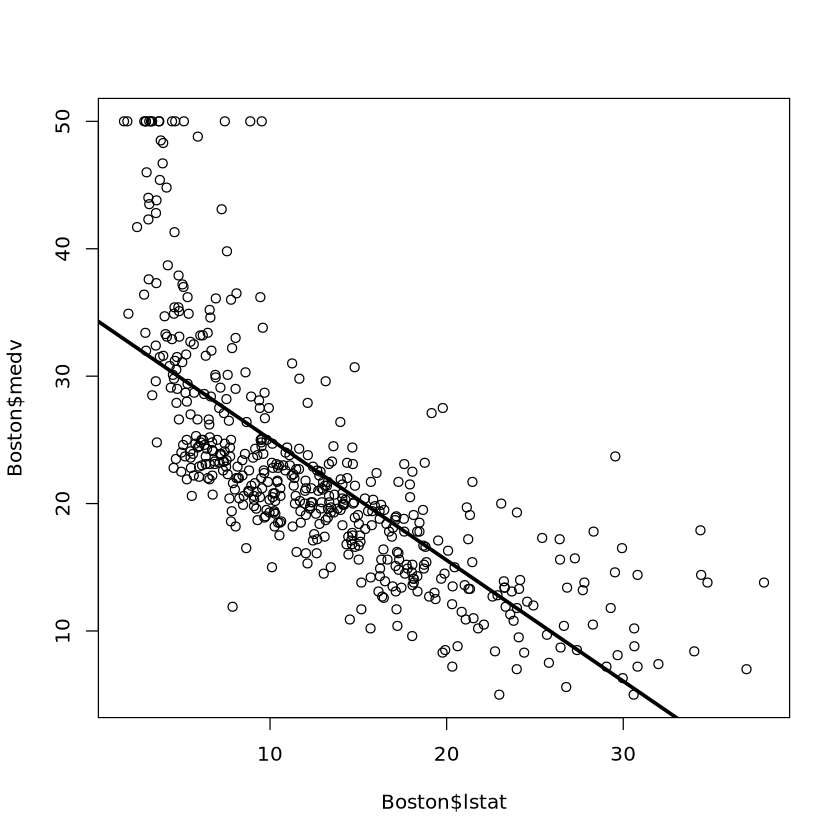

In [19]:
plot(Boston$lstat, Boston$medv)
abline(lm.fit, lwd = 3) 

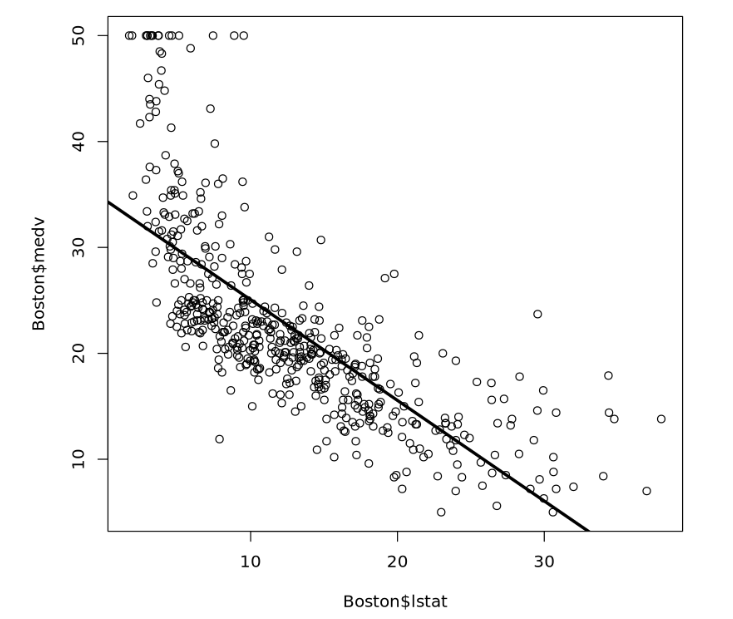

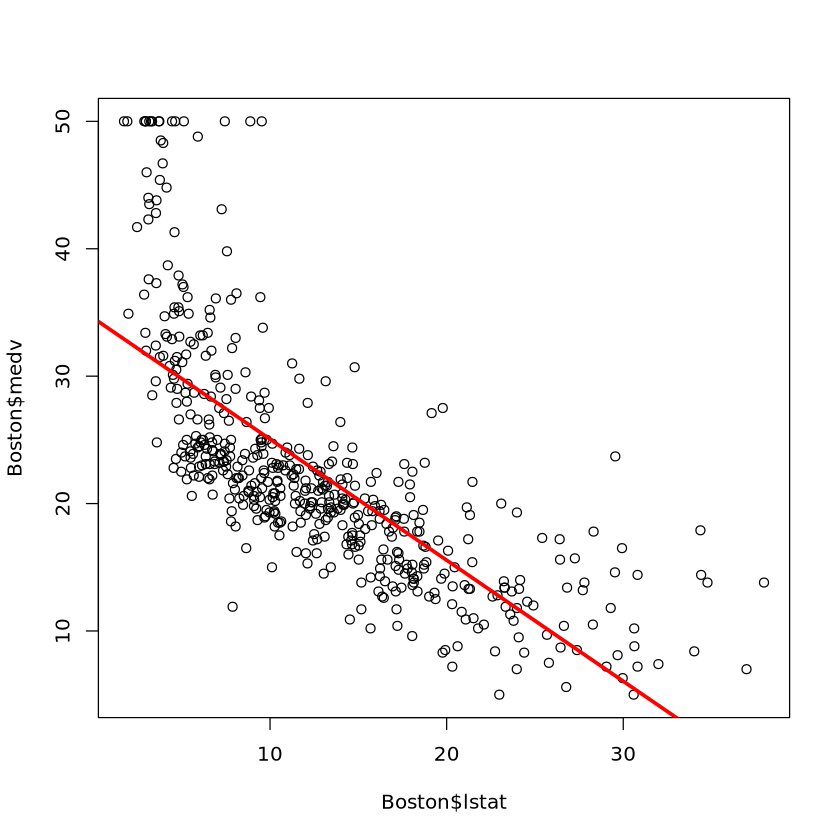

In [18]:
plot(Boston$lstat, Boston$medv)
abline(lm.fit, lwd = 3, col = "red") #

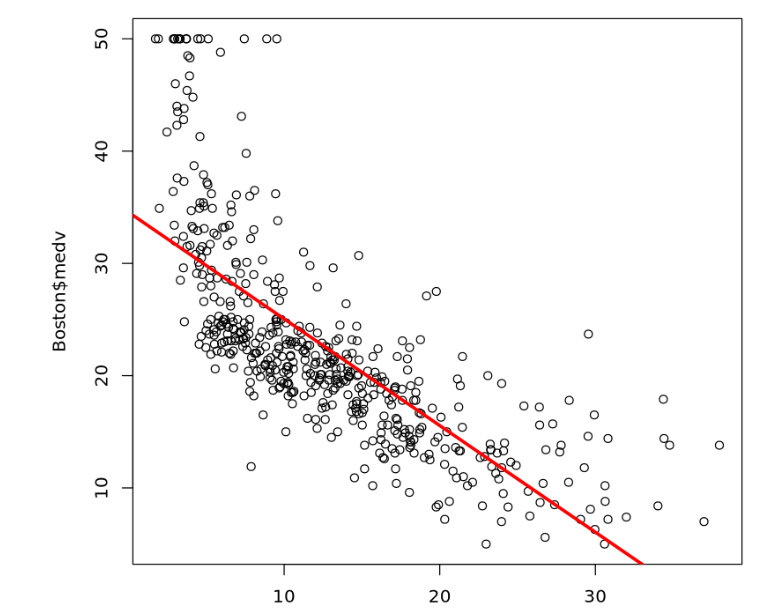

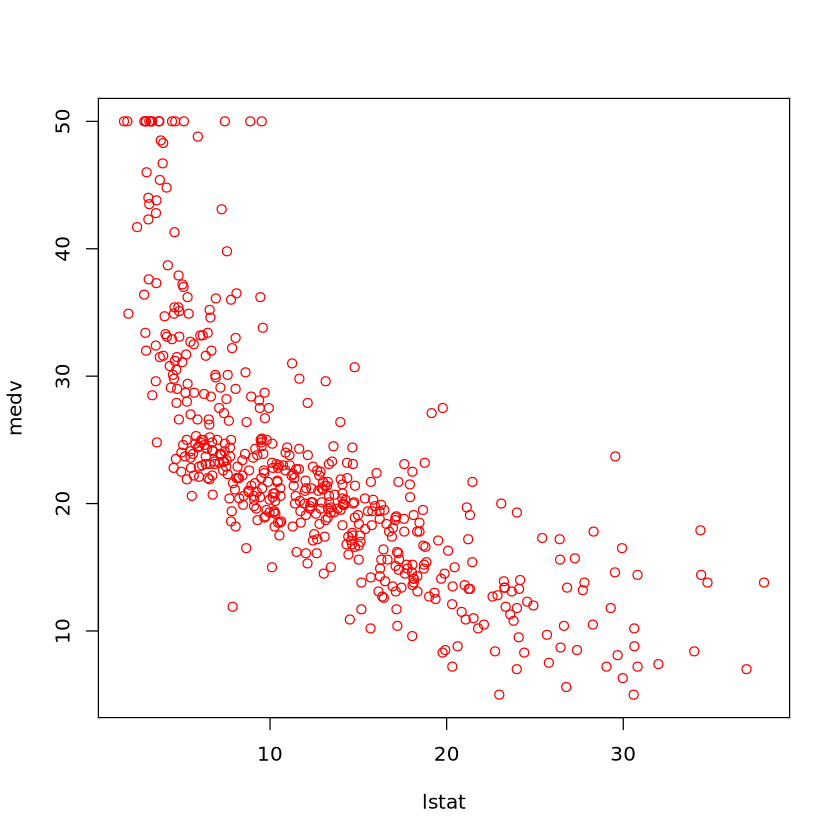

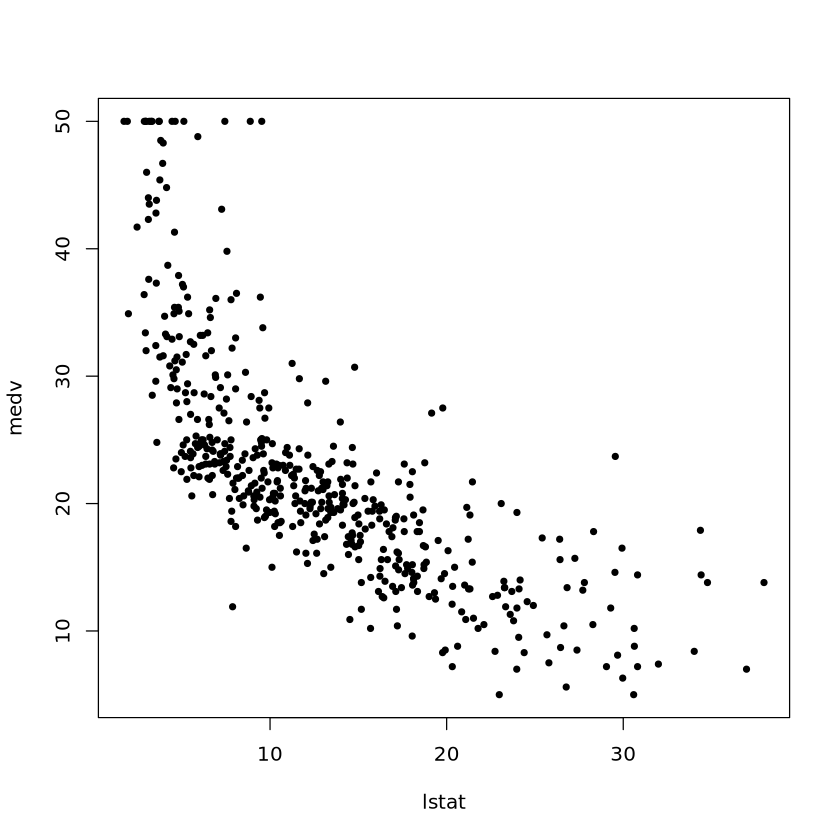

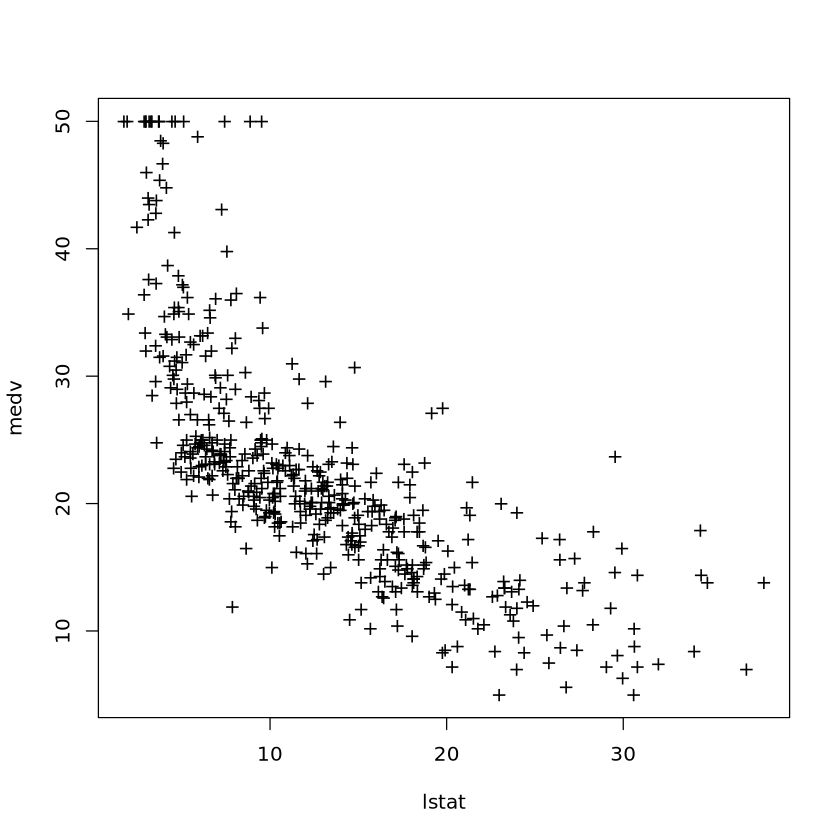

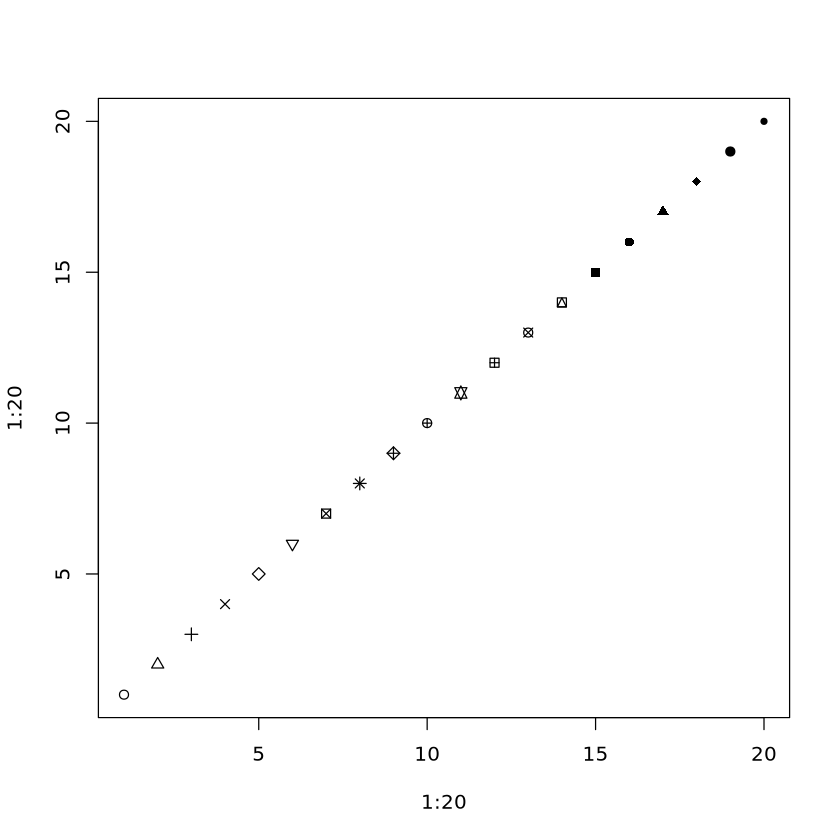

In [ ]:
attach(Boston)
plot(lstat, medv, col = "red")
plot(lstat, medv, pch = 20)
plot(lstat, medv, pch = "+")
plot(1:20, 1:20, pch = 1:20) #pch参数可以设置点的形状

接下来，我们研究一些诊断图，其中一些在第3.3.3节中讨论。

通过直接将plot（）函数应用于lm（）的输出，可以自动生成四个诊断图。

通常，该命令一次生成一个图形，点击Enter将生成下一个图形。然而，将所有四个图一起查看通常很方便。我们可以通过使用将显示屏幕分割成单独的面板来实现这一点，这样可以同时查看多个plot。例如，par（）和par(mfrow = c(2,2)) mfrow（）函数，它们将绘制区域划分为2 × 2网格的面板。

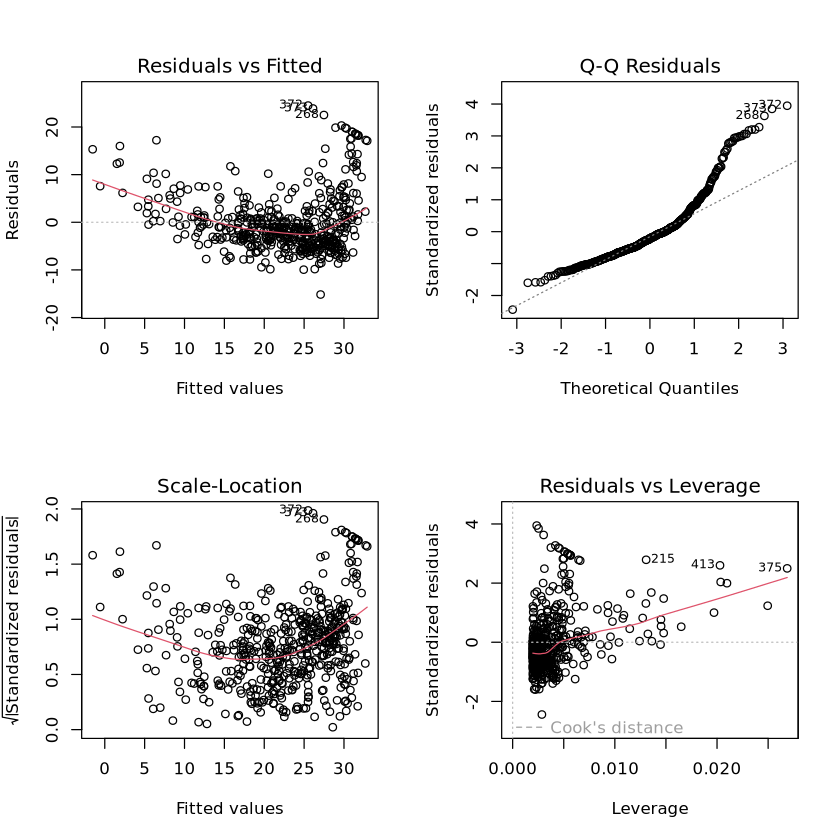

In [21]:
par(mfrow = c(2, 2))
plot(lm.fit)

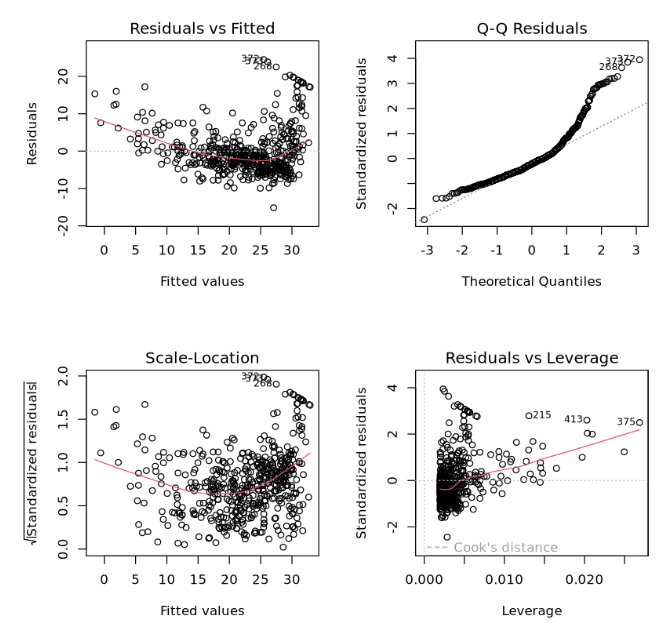

我们可以使用residuals（）函数从线性回归拟合中计算残差

函数rstudent（）将返回学生化的残差，我们可以使用这个函数来绘制残差与拟合值的关系

In [22]:
predict(lm.fit)

1          2          3          4          5          6          7 
29.8225951 25.8703898 30.7251420 31.7606958 29.4900778 29.6040837 22.7447274 
         8          9         10         11         12         13         14 
16.3603958  6.1188637 18.3079969 15.1253316 21.9466860 19.6285655 26.7064332 
        15         16         17         18         19         20         21 
24.8063345 26.5069229 28.3025161 20.6166169 23.4477639 23.8372842 14.5838035 
        22         23         24         25         26         27         28 
21.4146583 16.7689170 15.6668597 19.0680364 18.8685260 20.4836100 18.1369880 
        29         30         31         32         33         34         35 
22.3932092 23.1722496 13.0827255 22.1651973  8.2279733 17.1204352 15.2298370 
        36         37         38         39         40         41         42 
25.3573631 23.7137778 26.2219080 24.9298409 30.4496277 32.6727432 29.9556020 
        43         44         45         46         47         48         49 
29.0340541 27.4854737 25.4808696 24.8538370 21.1106425 16.6929130  5.2828203 
        50         51         52         53         54         55         56 
19.1630413 21.7756771 25.5948755 29.5375803 26.5449248 20.4931104 29.9841035 
        57         58         59         60         61         62         63 
29.0720561 30.8011459 28.0365023 25.7943858 22.0606919 20.8351282 28.1600087 
        64         65         66         67         68         69         70 
25.5283720 26.9059436 30.1171104 24.8253355 26.8584411 22.1176948 26.2029071 
        71         72         73         74         75         76         77 
28.1695092 25.1673533 29.3095684 27.3904688 28.1125063 26.0603997 23.1817501 
        78         79         80         81         82         83         84 
24.7968340 22.8302319 25.9083918 29.5280798 27.6944845 28.1695092 27.4189702 
        85         86         87         88         89         90         91 
25.4143661 28.3500186 22.3362062 26.5354243 29.3285694 29.1385596 26.1839061 
        92         93         94         95         96         97         98 
26.7634362 26.8014382 28.6540344 24.4928182 28.2360127 23.7802812 30.5541331 
        99        100        101        102        103        104        105 
31.1621647 28.6730354 25.6043760 27.2669623 24.4548162 21.7851776 22.8397323 
       106        107        108        109        110        111        112 
18.9065280 16.8259199 21.1676455 22.8967353 19.7805734 22.2031993 24.9013394 
       113        114        115        116        117        118        119 
19.1535409 18.3174974 24.6258251 19.5810631 23.1152467 24.7683325 19.9515823 
       120        121        122        123        124        125        126 
21.6236692 20.9016317 20.9966366 17.5194560 10.4130868 17.8519732 20.4836100 
       127        128        129        130        131        132        133 
 8.6554955 18.2224925 19.9325813 17.1299357 22.5832190 22.9062358 23.9892921 
       134        135        136        137        138        139        140 
20.2745991 18.1084866 18.4410038 18.4980068 20.6926208 14.2987887 17.0159298 
       141        142        143        144        145        146        147 
11.6006485  1.8626426  9.0735172  9.4535370  6.7268953  8.1424688 18.7355191 
       148        149        150        151        152        153        154 
 6.4988835  7.6484432 14.1752822 21.1581450 21.9371855 23.0392427 19.5525616 
       155        156        157        158        159        160        161 
20.1890947 20.2840996 19.2200443 30.1931143 28.4450235 27.5329762 29.3285694 
       162        163        164        165        166        167        168 
32.9102555 32.7297461 31.3996770 23.4952664 25.2338567 31.0386583 23.0202417 
       169        170        171        172        173        174        175 
24.0082931 23.7992822 20.8446287 23.1247472 20.5976159 25.9653947 25.3953651 
       176        177        178        179        180        181        182 
29.4900778 24.9488419 28.578030

In [23]:
residuals(lm.fit)

1             2             3             4             5 
 -5.822595098  -4.270389786   3.974858016   1.639304221   6.709922176 
            6             7             8             9            10 
 -0.904083746   0.155272588  10.739604245  10.381136279   0.592003070 
           11            12            13            14            15 
 -0.125331595  -3.046685955   2.071434468  -6.306433217  -6.606334510 
           16            17            18            19            20 
 -6.606922853  -5.202516132  -3.116616860  -3.247763934  -5.637284169 
           21            22            23            24            25 
 -0.983803463  -1.814658317  -1.568916977  -1.166859727  -3.468036413 
           26            27            28            29            30 
 -4.968526049  -3.883609950  -3.336988046  -3.993209151  -2.172249621 
           31            32            33            34            35 
 -0.382725484  -7.665197306   4.972026713  -4.020435238  -1.729837024 
           36            37            38            39            40 
 -6.457363135  -3.713777753  -5.221908047  -0.229840926   0.350372329 
           41            42            43            44            45 
  2.227256841  -3.355602007  -3.734054134  -2.785473687  -4.280869551 
           46            47            48            49            50 
 -5.553836978  -1.110642524  -0.092913029   9.117179710   0.236958651 
           51            52            53            54            55 
 -2.075677071  -5.094875473  -4.537580292  -3.144924827  -1.593110444 
           56            57            58            59            60 
  5.415896512  -4.372056108   0.798854068  -4.736502313  -6.194385838 
           61            62            63            64            65 
 -3.360691877  -4.835128211  -5.960008729  -0.528372019   6.094056418 
           66            67            68            69            70 
 -6.617110397  -5.425335497  -4.858441114  -4.717694839  -5.302907060 
           71            72            73            74            75 
 -3.969509222  -3.467353264  -6.509568447  -3.990468752  -4.012506261 
           76            77            78            79            80 
 -4.660399657  -3.181750115  -3.996834016  -1.630231854  -5.608391760 
           81            82            83            84            85 
 -1.528079798  -3.794484545  -3.369509222  -4.518970233  -1.514366096 
           86            87            88            89            90 
 -1.750018599   0.163793810  -4.335424334  -5.728569434  -0.438559563 
           91            92            93            94            95 
 -3.583906073  -4.763436179  -3.901438153  -3.654034393  -3.892818223 
           96            97            98            99           100 
  0.163987323  -2.380281208   8.145866900  12.637835314   4.526964620 
          101           102           103           104           105 
  1.895624033  -0.766962336  -5.854816249  -2.485177565  -2.739732348 
          106           107           108           109           110 
  0.593471977   2.674080062  -0.767645485  -3.096735309  -0.380573428 
          111           112           113           114           115 
 -0.503199281  -2.101339445  -0.353540855   0.382502576  -6.125825133 
          116           117           118           119           120 
 -1.281063064  -1.915246660  -5.568332536   0.448417688  -2.323669175 
          121           122           123           124           125 
  1.098368334  -0.696636601   2.980544033   6.886913200   0.948026760 
          126           127           128           129           130 
  0.916390050   7.044504504  -2.022492488  -1.932581325  -2.829935731 
          131           132           133           134           135 
 -3.383219022  -3.306235802  -0.989292066  -1.874599092  -2.508486566 
          136           137           138           139           140 
 -0.341003840  -1.098006801  -3.592620808  -0.998788657   0.784070191 
          141           142         

In [24]:
rstudent(lm.fit)

1             2             3             4             5 
-0.9386390949 -0.6875112380  0.6406663475  0.2642361813  1.0818817156 
            6             7             8             9            10 
-0.1456097331  0.0249804069  1.7343787934  1.6846408653  0.0952794075 
           11            12            13            14            15 
-0.0201873356 -0.4902737911  0.3333513061 -1.0160056474 -1.0641461877 
           16            17            18            19            20 
-1.0644855698 -0.8381704998 -0.5015686617 -0.5226539229 -0.9077061713 
           21            22            23            24            25 
-0.1584949730 -0.2919761614 -0.2526054641 -0.1879228730 -0.5582575125 
           26            27            28            29            30 
-0.8000801401 -0.6250972168 -0.5372348717 -0.6426943959 -0.3495186205 
           31            32            33            34            35 
-0.0616922494 -1.2350545475  0.8039708191 -0.6474889971 -0.2786394079 
           36            37            38            39            40 
-1.0401608536 -0.5977053817 -0.8409414467 -0.0369816063  0.0564446369 
           41            42            43            44            45 
 0.3591654837 -0.5406509730 -0.6015015801 -0.4484557731 -0.6891635995 
           46            47            48            49            50 
-0.8943192825 -0.1786944414 -0.0149589191  1.4794858706  0.0381314697 
           51            52            53            54            55 
-0.3339775922 -0.8203812780 -0.7311707412 -0.5062623681 -0.2563404990 
           56            57            58            59            60 
 0.8730186183 -0.7043758916  0.1287121421 -0.7629510120 -0.9977718320 
           61            62            63            64            65 
-0.5408303392 -0.7783956759 -0.9603849528 -0.0850219325  0.9817598989 
           66            67            68            69            70 
-1.0670936516 -0.8735927906 -0.7824206614 -0.7594240006 -0.8540018007 
           71            72            73            74            75 
-0.6393149090 -0.5580864992 -1.0494493151 -0.6425798716 -0.6462366514 
           76            77            78            79            80 
-0.7503893357 -0.5120203082 -0.6433491554 -0.2622913260 -0.9032354426 
           81            82            83            84            85 
-0.2461131076 -0.6110369562 -0.5426194571 -0.7277724940 -0.2436903210 
           86            87            88            89            90 
-0.2817720808  0.0263513078 -0.6980650938 -0.9233166303 -0.0706225851 
           91            92            93            94            95 
-0.5769379583 -0.7670891842 -0.6281591065 -0.5885415949 -0.6265756820 
           96            97            98            99           100 
 0.0264009338 -0.3830100622  1.3145866506  2.0449027089  0.7292791761 
          101           102           103           104           105 
 0.3050596281 -0.1234509789 -0.9428341365 -0.3998855460 -0.4408561813 
          106           107           108           109           110 
 0.0955061435  0.4305895999 -0.1235061997 -0.4983294267 -0.0612371578 
          111           112           113           114           115 
-0.0809557845 -0.3381443350 -0.0568920984  0.0615611068 -0.9865734343 
          116           117           118           119           120 
-0.2061457829 -0.3081576180 -0.8966496457  0.0721525005 -0.3738921987 
          121           122           123           124           125 
 0.1767219200 -0.1120825054  0.4798818865  1.1128636581  0.1525948463 
          126           127           128           129           130 
 0.1474460318  1.1395267440 -0.3255447312 -0.3109903067 -0.4556628625 
          131           132           133           134           135 
-0.5444551357 -0.5320608869 -0.1591693156 -0.3016473038 -0.4038029581 
          136           137           138           139           140 
-0.0548809193 -0.1767156366 -0.5782177177 -0.1609253191  0.1262266148 
          141           142         

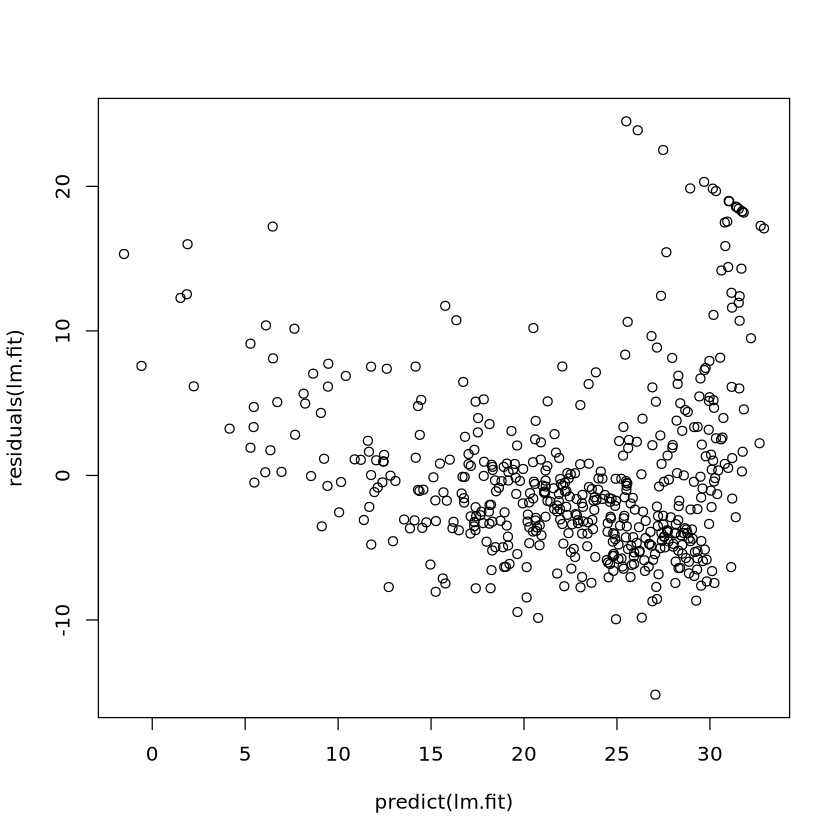

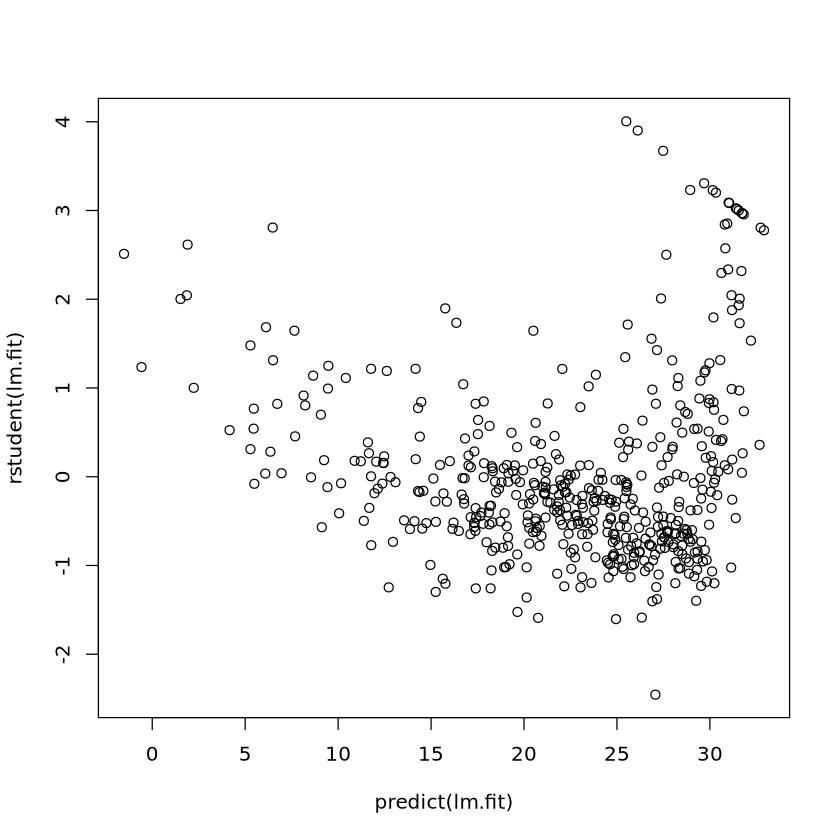

In [25]:
plot(predict(lm.fit), residuals(lm.fit))
plot(predict(lm.fit), rstudent(lm.fit))

根据残差图，有一些非线性的证据。可以使用hatvalues（）函数为任意数量的预测变量计算统计信息

375 
375

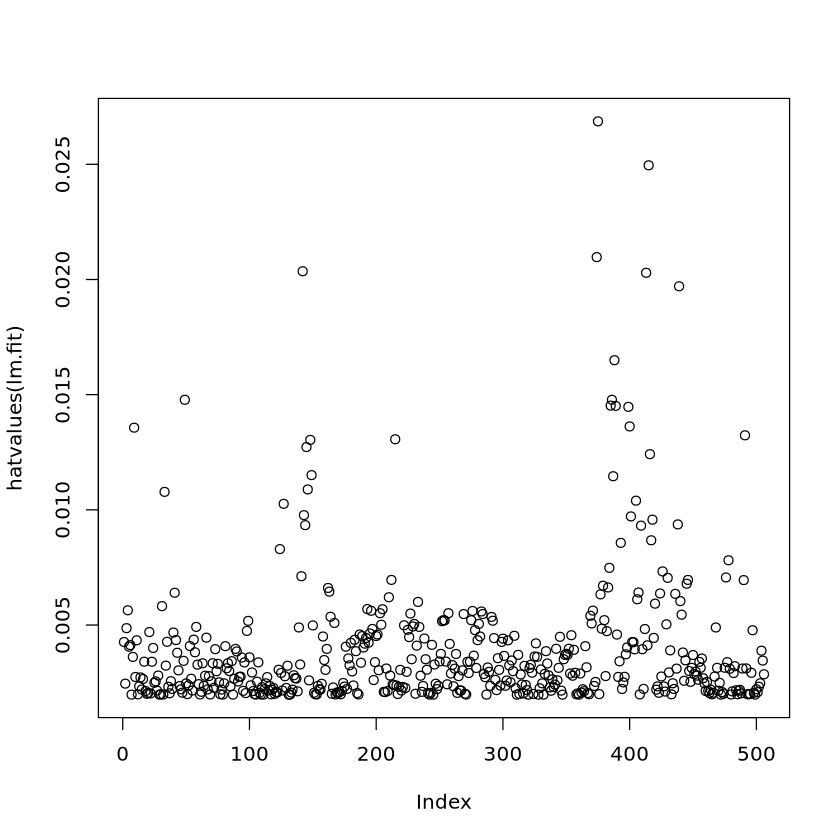

In [27]:
plot(hatvalues(lm.fit))
which.max(hatvalues(lm.fit))

Multiple Linear Regression 多元线性回归

为了使用最小二乘法拟合多元线性回归模型，我们再次使用lm（）函数。语法lm（y ~ x1 + x2 + x3）用于拟合一个具有三个预测因子x1、x2和x3的模型。summary（）函数现在输出所有预测变量的回归系数。

In [2]:
lm.fit <- lm(medv ~ lstat + age, data = Boston)
summary(lm.fit)


Call:
lm(formula = medv ~ lstat + age, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-15.981  -3.978  -1.283   1.968  23.158 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 33.22276    0.73085  45.458  < 2e-16 ***
lstat       -1.03207    0.04819 -21.416  < 2e-16 ***
age          0.03454    0.01223   2.826  0.00491 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.173 on 503 degrees of freedom
Multiple R-squared:  0.5513,	Adjusted R-squared:  0.5495 
F-statistic:   309 on 2 and 503 DF,  p-value: < 2.2e-16


In [3]:
# 对所有的12个变量进行的多元线性回归

lm.fit <- lm(medv ~ ., data = Boston)
summary(lm.fit)


Call:
lm(formula = medv ~ ., data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.1304  -2.7673  -0.5814   1.9414  26.2526 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  41.617270   4.936039   8.431 3.79e-16 ***
crim         -0.121389   0.033000  -3.678 0.000261 ***
zn            0.046963   0.013879   3.384 0.000772 ***
indus         0.013468   0.062145   0.217 0.828520    
chas          2.839993   0.870007   3.264 0.001173 ** 
nox         -18.758022   3.851355  -4.870 1.50e-06 ***
rm            3.658119   0.420246   8.705  < 2e-16 ***
age           0.003611   0.013329   0.271 0.786595    
dis          -1.490754   0.201623  -7.394 6.17e-13 ***
rad           0.289405   0.066908   4.325 1.84e-05 ***
tax          -0.012682   0.003801  -3.337 0.000912 ***
ptratio      -0.937533   0.132206  -7.091 4.63e-12 ***
lstat        -0.552019   0.050659 -10.897  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

In [7]:
?summary.lm  # 查看summary对象中的参数

summary.lm                package:stats                R Documentation

_S_u_m_m_a_r_i_z_i_n_g _L_i_n_e_a_r _M_o_d_e_l _F_i_t_s

_D_e_s_c_r_i_p_t_i_o_n:

     ‘summary’ method for class ‘"lm"’.

_U_s_a_g_e:

     ## S3 method for class 'lm'
     summary(object, correlation = FALSE, symbolic.cor = FALSE, ...)
     
     ## S3 method for class 'summary.lm'
     print(x, digits = max(3, getOption("digits") - 3),
           symbolic.cor = x$symbolic.cor,
           signif.stars = getOption("show.signif.stars"), ...)
     
_A_r_g_u_m_e_n_t_s:

  object: an object of class ‘"lm"’, usually, a result of a call to
          ‘lm’.

       x: an object of class ‘"summary.lm"’, usually, a result of a
          call to ‘summary.lm’.

correlation: logical; if ‘TRUE’, the correlation matrix of the
          estimated parameters is returned and printed.

  digits: the number of significant digits to use when printing.

symbolic.cor: logical. If ‘TRUE’

In [9]:
summary(object = lm.fit)


Call:
lm(formula = medv ~ ., data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.1304  -2.7673  -0.5814   1.9414  26.2526 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  41.617270   4.936039   8.431 3.79e-16 ***
crim         -0.121389   0.033000  -3.678 0.000261 ***
zn            0.046963   0.013879   3.384 0.000772 ***
indus         0.013468   0.062145   0.217 0.828520    
chas          2.839993   0.870007   3.264 0.001173 ** 
nox         -18.758022   3.851355  -4.870 1.50e-06 ***
rm            3.658119   0.420246   8.705  < 2e-16 ***
age           0.003611   0.013329   0.271 0.786595    
dis          -1.490754   0.201623  -7.394 6.17e-13 ***
rad           0.289405   0.066908   4.325 1.84e-05 ***
tax          -0.012682   0.003801  -3.337 0.000912 ***
ptratio      -0.937533   0.132206  -7.091 4.63e-12 ***
lstat        -0.552019   0.050659 -10.897  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

In [ ]:
summary(lm.fit)$r.sq # 模型的R方，未矫正前的 
summary(lm.fit)$sigma # 模型的RSE，残差标准误差                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

[1] 0.734307

[1] 4.798034

In [ ]:
# car包中的vif函数，可以用于计算方差膨胀因子，variance infation factors
# install.packages("car")
library(car)
vif(lm.fit)

# 使用vif函数取不同自变量的方差膨胀因子，并进行开根号。如果大于2，代表自变量与其他变量存在共线性，此时需要对模型进行优化

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Loading required package: carData



crim       zn    indus     chas      nox       rm      age      dis 
1.767486 2.298459 3.987181 1.071168 4.369093 1.912532 3.088232 3.954037 
     rad      tax  ptratio    lstat 
7.445301 9.002158 1.797060 2.870777

In [12]:
print(vif(lm.fit))

    crim       zn    indus     chas      nox       rm      age      dis 
1.767486 2.298459 3.987181 1.071168 4.369093 1.912532 3.088232 3.954037 
     rad      tax  ptratio    lstat 
7.445301 9.002158 1.797060 2.870777 


如果我们想使用除一个变量之外的所有变量执行回归呢？例如，在上述回归输出中，年龄具有较高的p值。因此，我们可能希望运行一个回归排除这个预测因素。下面的语法将使用除年龄之外的所有预测因子进行回归。

In [18]:
lm.fit1 <- lm(medv ~ . - age, data = Boston)
summary(lm.fit1)


Call:
lm(formula = medv ~ . - age, data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.1851  -2.7330  -0.6116   1.8555  26.3838 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  41.525128   4.919684   8.441 3.52e-16 ***
crim         -0.121426   0.032969  -3.683 0.000256 ***
zn            0.046512   0.013766   3.379 0.000785 ***
indus         0.013451   0.062086   0.217 0.828577    
chas          2.852773   0.867912   3.287 0.001085 ** 
nox         -18.485070   3.713714  -4.978 8.91e-07 ***
rm            3.681070   0.411230   8.951  < 2e-16 ***
dis          -1.506777   0.192570  -7.825 3.12e-14 ***
rad           0.287940   0.066627   4.322 1.87e-05 ***
tax          -0.012653   0.003796  -3.333 0.000923 ***
ptratio      -0.934649   0.131653  -7.099 4.39e-12 ***
lstat        -0.547409   0.047669 -11.483  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4.794 on 494 degrees o

In [17]:
lm.fit2 <- lm(medv ~ . - age - indus, data = Boston)
summary(lm.fit2)


Call:
lm(formula = medv ~ . - age - indus, data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.1814  -2.7625  -0.6243   1.8448  26.3920 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  41.451747   4.903283   8.454 3.18e-16 ***
crim         -0.121665   0.032919  -3.696 0.000244 ***
zn            0.046191   0.013673   3.378 0.000787 ***
chas          2.871873   0.862591   3.329 0.000935 ***
nox         -18.262427   3.565247  -5.122 4.33e-07 ***
rm            3.672957   0.409127   8.978  < 2e-16 ***
dis          -1.515951   0.187675  -8.078 5.08e-15 ***
rad           0.283932   0.063945   4.440 1.11e-05 ***
tax          -0.012292   0.003407  -3.608 0.000340 ***
ptratio      -0.930961   0.130423  -7.138 3.39e-12 ***
lstat        -0.546509   0.047442 -11.519  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 4.789 on 495 degrees of freedom
Multiple R-squared:  0.7342,	Adjusted

In [ ]:
# 或者，也可以使用update函数 # update and (by default) re-fit a model
lm.fit3 <- update(lm.fit, ~ . - age)
summary(lm.fit3)


Call:
lm(formula = medv ~ crim + zn + indus + chas + nox + rm + dis + 
    rad + tax + ptratio + lstat, data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.1851  -2.7330  -0.6116   1.8555  26.3838 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  41.525128   4.919684   8.441 3.52e-16 ***
crim         -0.121426   0.032969  -3.683 0.000256 ***
zn            0.046512   0.013766   3.379 0.000785 ***
indus         0.013451   0.062086   0.217 0.828577    
chas          2.852773   0.867912   3.287 0.001085 ** 
nox         -18.485070   3.713714  -4.978 8.91e-07 ***
rm            3.681070   0.411230   8.951  < 2e-16 ***
dis          -1.506777   0.192570  -7.825 3.12e-14 ***
rad           0.287940   0.066627   4.322 1.87e-05 ***
tax          -0.012653   0.003796  -3.333 0.000923 ***
ptratio      -0.934649   0.131653  -7.099 4.39e-12 ***
lstat        -0.547409   0.047669 -11.483  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*

使用lm（）函数可以很容易地在线性模型中包括交互项。

语法lstat:age告诉R在lstat和age之间包含一个交互项。

语法lstat * age同时包括lstat、age和交互项lstat×age作为预测符；它是lstat + age + lstat:age的缩写。

多个变量之间的交互作用：https://zh.wikipedia.org/wiki/%E4%BA%A4%E4%BA%92%E4%BD%9C%E7%94%A8_(%E7%BB%9F%E8%AE%A1%E5%AD%A6)

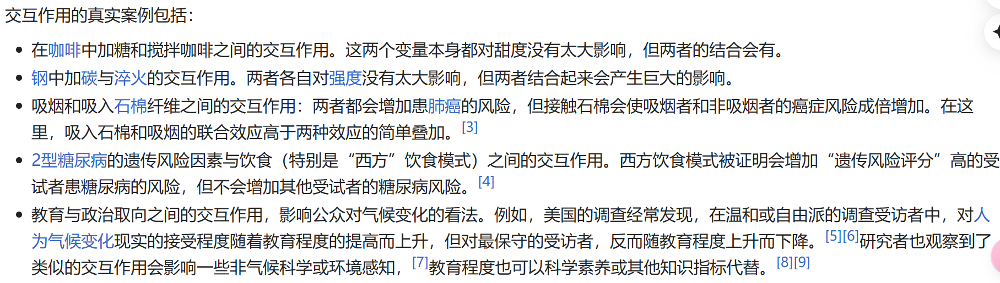
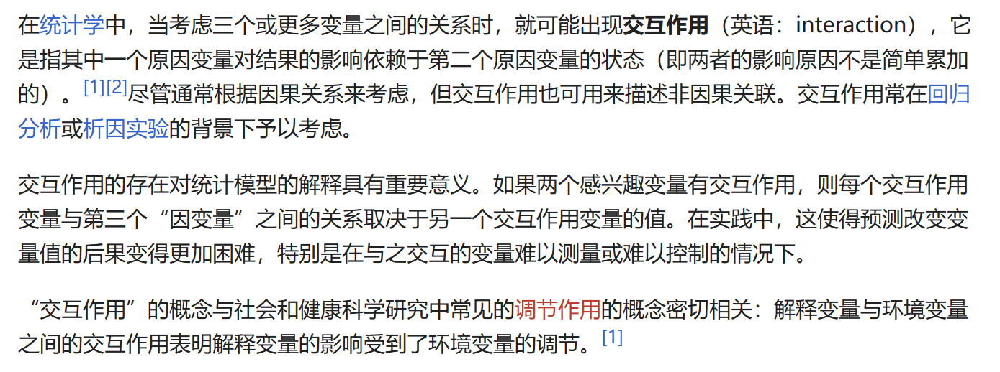

其中一个原因变量对结果的影响依赖于第二个原因变量的状态（即两者的影响原因不是简单累加的）

age (proportion of owner-occupied units built prior to 1940), and lstat (percent of households with low socioeconomic status).

age（1940年之前建造的自住单元的比例）和lstat（社会经济地位较低的家庭的百分比）

来预测medv房假中位数

In [ ]:
summary(lm(medv ~ lstat * age, data = Boston)) 


Call:
lm(formula = medv ~ lstat * age, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-15.806  -4.045  -1.333   2.085  27.552 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept) 36.0885359  1.4698355  24.553  < 2e-16 ***
lstat       -1.3921168  0.1674555  -8.313 8.78e-16 ***
age         -0.0007209  0.0198792  -0.036   0.9711    
lstat:age    0.0041560  0.0018518   2.244   0.0252 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.149 on 502 degrees of freedom
Multiple R-squared:  0.5557,	Adjusted R-squared:  0.5531 
F-statistic: 209.3 on 3 and 502 DF,  p-value: < 2.2e-16


解读参考如下：

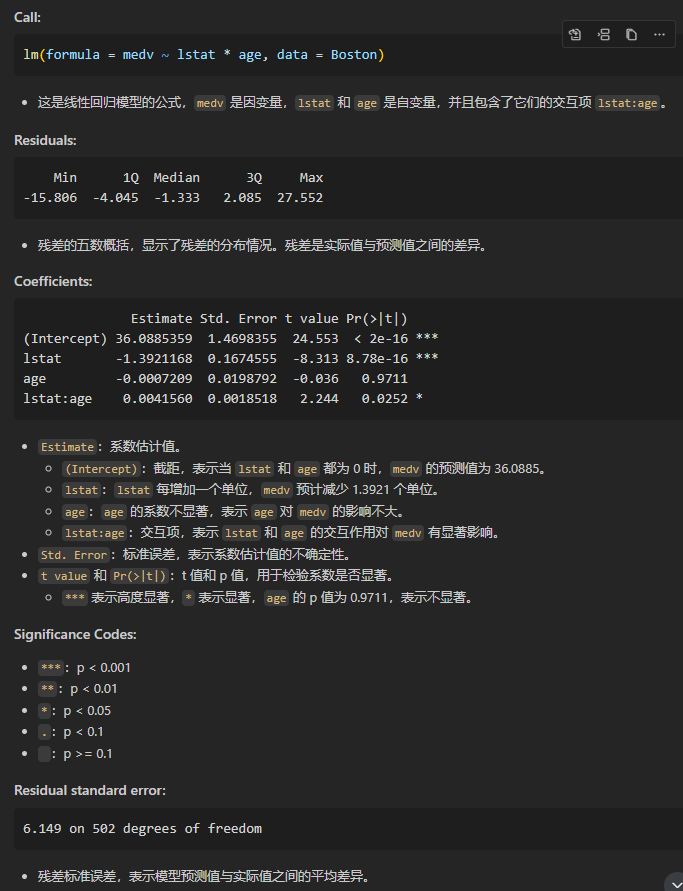
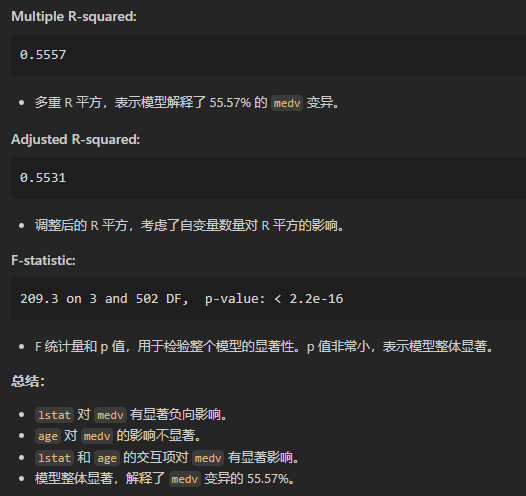

Non-linear Transformations of the Predictors 预测变量的非线性转换


lm（）函数还可以适应预测变量的非线性转换。

例如，给定预测器变量X，我们可以在公式对象中创建预测变量X2；这样的包装允许I（X^2）的标准用法。

函数I（）是必需的，因为^有一个特殊的意义R，即提高X的2次方。现在我们将medv回归到lstat和lstat2。

In [ ]:
lm.fit2 <- lm(medv ~ lstat + I(lstat^2),data = Boston) # 不能写成medv ~ lstat + lstat^2
summary(lm.fit2)


Call:
lm(formula = medv ~ lstat + I(lstat^2), data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-15.2834  -3.8313  -0.5295   2.3095  25.4148 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 42.862007   0.872084   49.15   <2e-16 ***
lstat       -2.332821   0.123803  -18.84   <2e-16 ***
I(lstat^2)   0.043547   0.003745   11.63   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 5.524 on 503 degrees of freedom
Multiple R-squared:  0.6407,	Adjusted R-squared:  0.6393 
F-statistic: 448.5 on 2 and 503 DF,  p-value: < 2.2e-16


与二次项相关的接近零的p值表明它导致了一个改进的模型。我们使用anova（）函数进一步量化二次拟合优于线性拟合的程度

线性拟合：

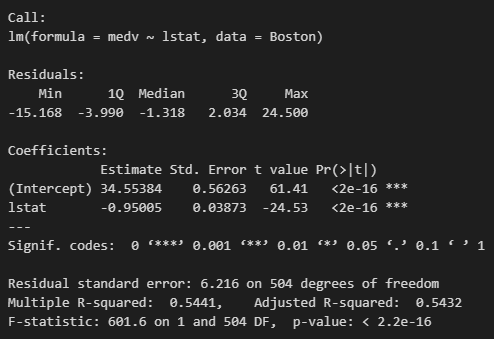

二次项拟合（非线性拟合）：

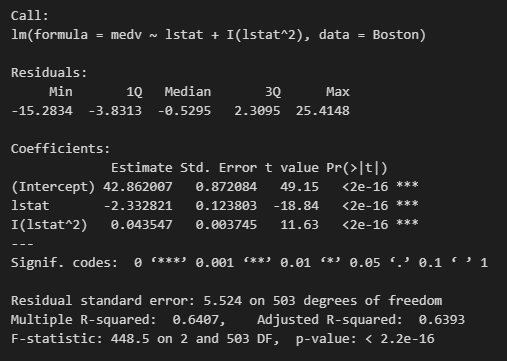

In [26]:
lm.fit <- lm(medv ~ lstat,data = Boston)
summary(lm.fit)
anova(lm.fit, lm.fit2)


Call:
lm(formula = medv ~ lstat, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-15.168  -3.990  -1.318   2.034  24.500 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 34.55384    0.56263   61.41   <2e-16 ***
lstat       -0.95005    0.03873  -24.53   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.216 on 504 degrees of freedom
Multiple R-squared:  0.5441,	Adjusted R-squared:  0.5432 
F-statistic: 601.6 on 1 and 504 DF,  p-value: < 2.2e-16


,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,504,19472.38,NA,NA,NA,NA
2,504,19472.38,0,0,NA,NA


In [28]:
lm.fit <- lm(medv ~ lstat,data = Boston)
lm.fit2 <- lm(medv ~ lstat + I(lstat^2),data = Boston)
anova(lm.fit, lm.fit2)

,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,504,19472.38,NA,NA,NA,NA
2,503,15347.24,1,4125.138,135.1998,7.630116e-28


这里模型1表示线性子模型，只包含一个预测因子lstat，而模型2对应的是较大的二次模型，它有两个预测因子lstat和lstat2。

anova（）函数执行一个比较两个模型的假设检验。零假设是两个模型都能很好地拟合数据，备择假设是完整模型更优。这里的f统计量是135，相关的p值几乎为零。

这提供了非常明确的证据，证明包含预测器lstat和lstat2的模型比只包含预测器lstat的模型要好得多。这并不奇怪，因为我们之前看到
medv和lstat之间非线性关系的证据

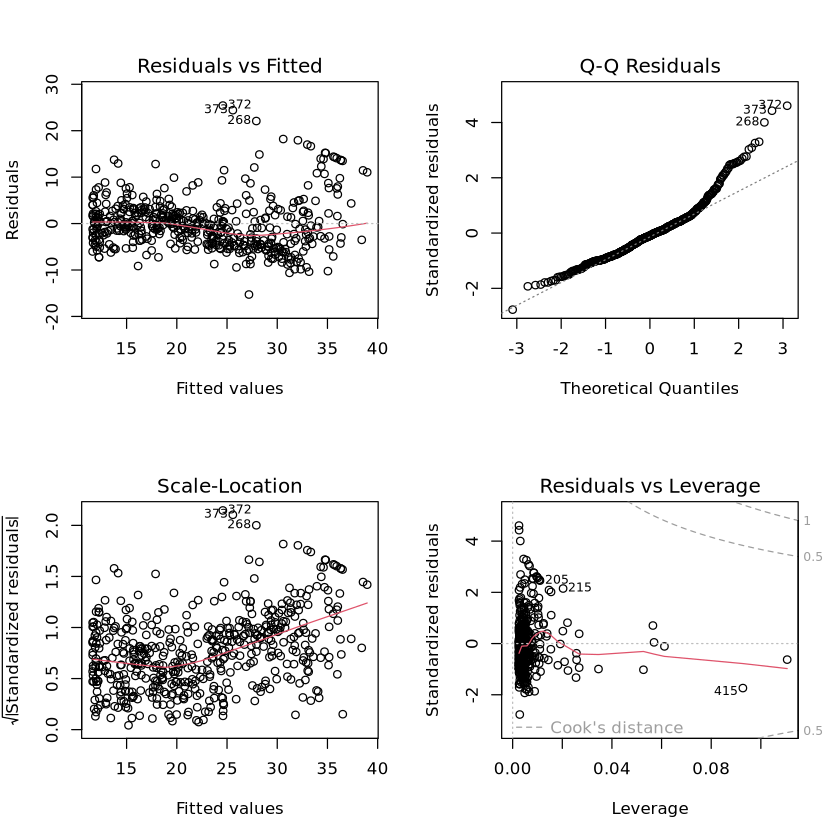

In [29]:
par(mfrow = c(2, 2))
plot(lm.fit2)

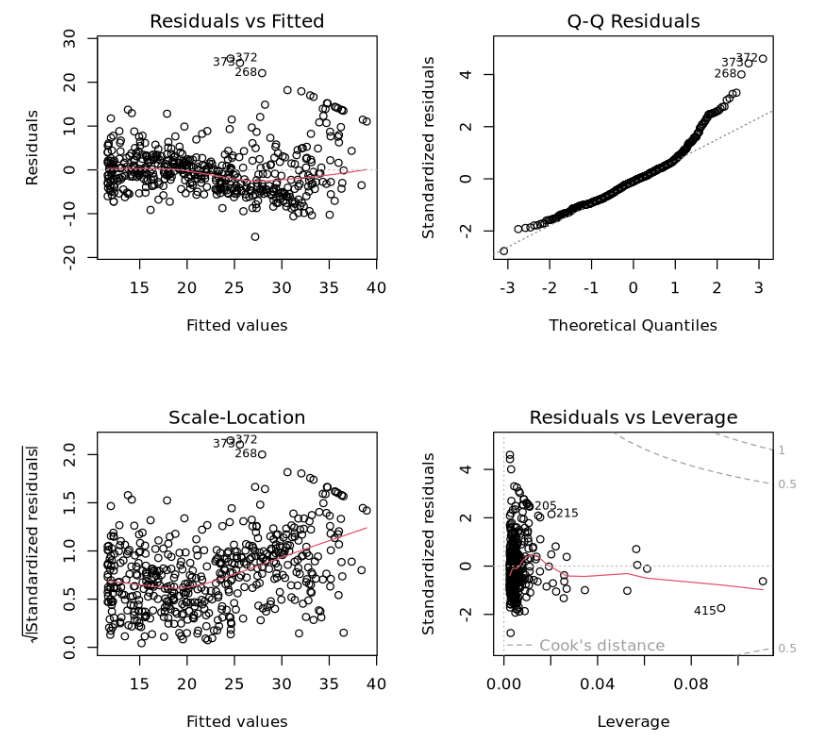

然后我们看到，当lstat2项包含在模型中时，在残差中几乎没有可识别的模式。

为了创建一个三次拟合，我们可以包括一个I（X^3）形式的预测器。

然而，对于高阶多项式，这种方法开始变得繁琐。更好的方法是在lm（）中使用来创建多项式。

例如，下面的命令poly（）函数poly（）产生一个五阶多项式拟合：

In [31]:
lm.fit5 <- lm(medv ~ poly(lstat, 5),data = Boston)
summary(lm.fit5)


Call:
lm(formula = medv ~ poly(lstat, 5), data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-13.5433  -3.1039  -0.7052   2.0844  27.1153 

Coefficients:
                 Estimate Std. Error t value Pr(>|t|)    
(Intercept)       22.5328     0.2318  97.197  < 2e-16 ***
poly(lstat, 5)1 -152.4595     5.2148 -29.236  < 2e-16 ***
poly(lstat, 5)2   64.2272     5.2148  12.316  < 2e-16 ***
poly(lstat, 5)3  -27.0511     5.2148  -5.187 3.10e-07 ***
poly(lstat, 5)4   25.4517     5.2148   4.881 1.42e-06 ***
poly(lstat, 5)5  -19.2524     5.2148  -3.692 0.000247 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 5.215 on 500 degrees of freedom
Multiple R-squared:  0.6817,	Adjusted R-squared:  0.6785 
F-statistic: 214.2 on 5 and 500 DF,  p-value: < 2.2e-16


这表明，包括额外的多项式项，最多五阶，导致模型拟合的改进！然而，数据的进一步调查表明，在回归拟合中，没有超过五阶的多项式项有显著的p值

默认情况下，poly（）函数将预测函数正交：这意味着该函数输出的特征不只是参数的幂序列。

然而，应用于poly（）函数输出的线性模型将具有与应用于原始多项式的线性模型相同的拟合值（尽管系数估计值、标准误和p值会有所不同）。

为了从poly（）函数中获得原始的多项式，必须使用参数raw = TRUE。

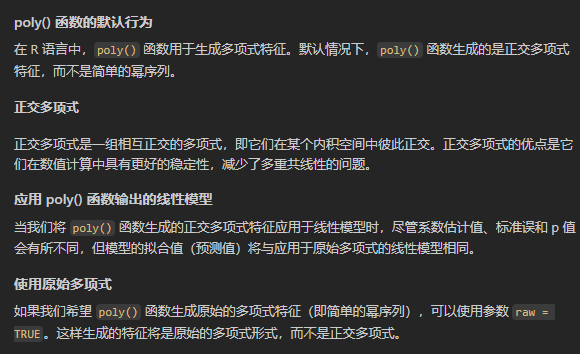
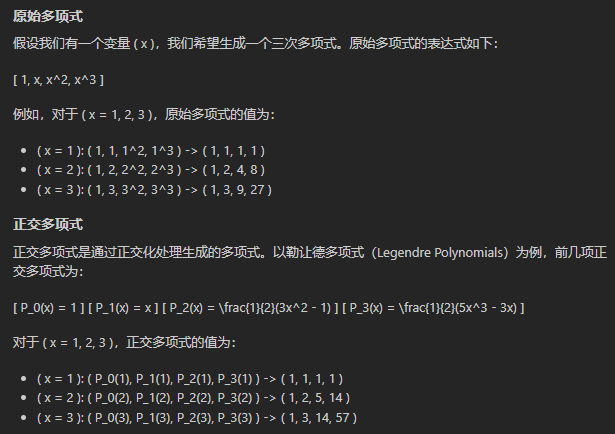

In [33]:
# 当然，我们并不局限于使用多项式变换来进行预测。这里我们尝试一个对数变换
summary(lm(medv ~ log(lstat), data = Boston))
summary(lm(medv ~ log(rm), data = Boston))


Call:
lm(formula = medv ~ log(lstat), data = Boston)

Residuals:
     Min       1Q   Median       3Q      Max 
-14.4599  -3.5006  -0.6686   2.1688  26.0129 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  52.1248     0.9652   54.00   <2e-16 ***
log(lstat)  -12.4810     0.3946  -31.63   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 5.329 on 504 degrees of freedom
Multiple R-squared:  0.6649,	Adjusted R-squared:  0.6643 
F-statistic:  1000 on 1 and 504 DF,  p-value: < 2.2e-16



Call:
lm(formula = medv ~ log(rm), data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-19.487  -2.875  -0.104   2.837  39.816 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -76.488      5.028  -15.21   <2e-16 ***
log(rm)       54.055      2.739   19.73   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.915 on 504 degrees of freedom
Multiple R-squared:  0.4358,	Adjusted R-squared:  0.4347 
F-statistic: 389.3 on 1 and 504 DF,  p-value: < 2.2e-16


In [34]:
# 生成正交多项式特征
x <- 1:10
poly_features <- poly(x, degree = 3)
print(poly_features)

# 生成原始多项式特征
raw_poly_features <- poly(x, degree = 3, raw = TRUE)
print(raw_poly_features)

                1           2          3
 [1,] -0.49543369  0.52223297 -0.4534252
 [2,] -0.38533732  0.17407766  0.1511417
 [3,] -0.27524094 -0.08703883  0.3778543
 [4,] -0.16514456 -0.26111648  0.3346710
 [5,] -0.05504819 -0.34815531  0.1295501
 [6,]  0.05504819 -0.34815531 -0.1295501
 [7,]  0.16514456 -0.26111648 -0.3346710
 [8,]  0.27524094 -0.08703883 -0.3778543
 [9,]  0.38533732  0.17407766 -0.1511417
[10,]  0.49543369  0.52223297  0.4534252
attr(,"coefs")
attr(,"coefs")$alpha
[1] 5.5 5.5 5.5

attr(,"coefs")$norm2
[1]    1.0   10.0   82.5  528.0 3088.8

attr(,"degree")
[1] 1 2 3
attr(,"class")
[1] "poly"   "matrix"
       1   2    3
 [1,]  1   1    1
 [2,]  2   4    8
 [3,]  3   9   27
 [4,]  4  16   64
 [5,]  5  25  125
 [6,]  6  36  216
 [7,]  7  49  343
 [8,]  8  64  512
 [9,]  9  81  729
[10,] 10 100 1000
attr(,"degree")
[1] 1 2 3
attr(,"class")
[1] "poly"   "matrix"


Qualitative Predictors 定性预测

In [35]:
# 现在使用的是其他的数据，ISLR2库中的Carseats数据集 
# 我们将尝试基于一些预测因素来预测400个地点的销售Sales（儿童汽车座椅的销售）
head(Carseats)

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<fct>,<fct>
1,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
2,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
3,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
4,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
5,4.15,141,64,3,340,128,Bad,38,13,Yes,No
6,10.81,124,113,13,501,72,Bad,78,16,No,Yes


我们可以看到这些预测变量中，除了定量的变量之外，还包括了定性的变量，比如说是Shelveloc，它是货架位置质量的一个指标，也就是商店中展示汽车座椅的空间；

然后这一个变量的取值总共有3个可能的值：差，中，好。

给定一个定性变量，如Shelveloc， R会自动生成哑变量。下面我们给出一个包含一些交互项的多元回归模型。

In [36]:
lm.fit <- lm(Sales ~ . + Income:Advertising + Price:Age, data = Carseats) # Income:Advertising表示Income和Advertising的交互项，以及原始数据中的定性项：ShelveLoc	
summary(lm.fit)


Call:
lm(formula = Sales ~ . + Income:Advertising + Price:Age, data = Carseats)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.9208 -0.7503  0.0177  0.6754  3.3413 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)         6.5755654  1.0087470   6.519 2.22e-10 ***
CompPrice           0.0929371  0.0041183  22.567  < 2e-16 ***
Income              0.0108940  0.0026044   4.183 3.57e-05 ***
Advertising         0.0702462  0.0226091   3.107 0.002030 ** 
Population          0.0001592  0.0003679   0.433 0.665330    
Price              -0.1008064  0.0074399 -13.549  < 2e-16 ***
ShelveLocGood       4.8486762  0.1528378  31.724  < 2e-16 ***
ShelveLocMedium     1.9532620  0.1257682  15.531  < 2e-16 ***
Age                -0.0579466  0.0159506  -3.633 0.000318 ***
Education          -0.0208525  0.0196131  -1.063 0.288361    
UrbanYes            0.1401597  0.1124019   1.247 0.213171    
USYes              -0.1575571  0.1489234  -1.058 0.290729    
Inco

contrasts（）函数的作用是：返回R使用的虚拟变量的编码。

In [37]:
attach(Carseats)
contrasts(ShelveLoc)

,Good,Medium
Bad,0,0
Good,1,0
Medium,0,1


R创建了一个ShelveLocGood虚拟变量，如果放置位置良好，该变量的值为1，否则为0。

它还创建了一个ShelveLocMedium虚拟变量，如果搁置位置是中等，则该变量等于1，否则等于0。

一个糟糕的搁置位置对应于两个虚拟变量的零。

事实上，ShelveLocGood在回归输出中的系数是正的，这表明一个好的货架位置与高销量相关（相对于一个不好的位置）。而ShelveLocMedium的正系数较小，表明中等货架位置的销量高于差货架位置，但低于好货架位置

Writing Function 自己手写函数

In [40]:
LoadLibraries <- function(){
    library(ISLR2)
    library(MASS)
    print("the libraries ISLR2 & MASS have been loaded")
}

In [ ]:
LoadLibraries  #该函数的信息
LoadLibraries() #该函数的执行

function () 
{
    library(ISLR2)
    library(MASS)
    print("the libraries ISLR2 & MASS have been loaded")
}

[1] "the libraries ISLR2 & MASS have been loaded"


二，练习部分

Section 3.7 Exercises 3, 4, 9, 13

3，

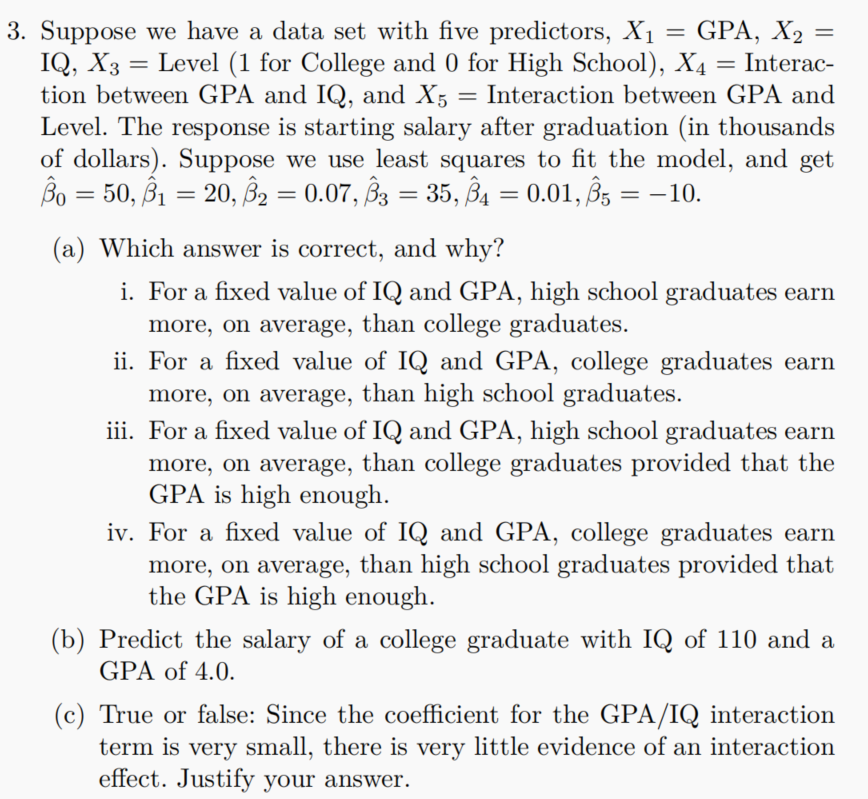

$y = \beta_0 + \beta_1 \cdot \text{GPA} + \beta_2 \cdot \text{IQ} + \beta_3 \cdot \text{Level} + \beta_4 \cdot \text{GPA} \cdot \text{IQ} + \beta_5 \cdot \text{GPA} \cdot \text{Level}$



$$
y = \beta_0 + \beta_1 \cdot \text{GPA} + \beta_2 \cdot \text{IQ} + \beta_3 \cdot \text{Level} + \beta_4 \cdot \text{GPA} \cdot \text{IQ} + \beta_5 \cdot \text{GPA} \cdot \text{Level}
$$

其中，系数估计值为：

$$
\begin{align*}
\hat{\beta}_0 &= 50 \\
\hat{\beta}_1 &= 20 \\
\hat{\beta}_2 &= 0.07 \\
\hat{\beta}_3 &= 35 \\
\hat{\beta}_4 &= 0.01 \\
\hat{\beta}_5 &= -10 \\
\end{align*}
$$

假设我们有一个包含五个预测变量的数据集，分别是：X1 = GPA, X2 = IQ, X3 = Level（1 表示 College，0 表示 High School），X4 = GPA 和 IQ 的交互项，X5 = GPA 和 Level 的交互项。响应变量是毕业后的起始薪水（以千美元为单位）。假设我们使用最小二乘法拟合模型，并得到以下系数估计值：

$$
y = 50 + 20 \cdot \text{GPA} + 0.07 \cdot \text{IQ} + 35 \cdot \text{Level} + 0.01 \cdot \text{GPA} \cdot \text{IQ} - 10 \cdot \text{GPA} \cdot \text{Level}
$$

a

如果固定IQ和GPA，然后我们只考虑level的话，比如说从高中生变到大学生，也就是level的值从0变到1的话，那么对于salary的影响就是：

$$
y1 = 50 + 20 \cdot \text{GPA} + 0.07 \cdot \text{IQ} + 0.01 \cdot \text{GPA} \cdot \text{IQ} 
$$  

$$
y2 = 50 + 20 \cdot \text{GPA} + 0.07 \cdot \text{IQ} + 35 + 0.01 \cdot \text{GPA} \cdot \text{IQ} - 10 \cdot \text{GPA} 
$$ 


$\Delta y = y2 - y1 = 35 - 10 \cdot \text{GPA}$     

$\Delta y > 0 \Rightarrow \text{GPA} <  \dfrac{35}{10} = 3.5$ 

所以意思就是如果固定IQ的话，只有GPA低于一定程度，大学生的初始薪水才会比高中生多，也就是只有GPA高于一定程度，高中生的初始薪水水平会比高中生多

In [2]:
?outer

outer                   package:base                   R Documentation

_O_u_t_e_r _P_r_o_d_u_c_t _o_f _A_r_r_a_y_s

_D_e_s_c_r_i_p_t_i_o_n:

     The outer product of the arrays ‘X’ and ‘Y’ is the array ‘A’ with
     dimension ‘c(dim(X), dim(Y))’ where element ‘A[c(arrayindex.x,
     arrayindex.y)] = FUN(X[arrayindex.x], Y[arrayindex.y], ...)’.

_U_s_a_g_e:

     outer(X, Y, FUN = "*", ...)
     X %o% Y
     
_A_r_g_u_m_e_n_t_s:

    X, Y: first and second arguments for function ‘FUN’.  Typically a
          vector or array.

     FUN: a function to use on the outer products, found _via_
          ‘match.fun’ (except for the special case ‘"*"’).

     ...: optional arguments to be passed to ‘FUN’.

_D_e_t_a_i_l_s:

     ‘X’ and ‘Y’ must be suitable arguments for ‘FUN’.  Each will be
     extended by ‘rep’ to length the products of the lengths of ‘X’ and
     ‘Y’ before ‘FUN’ is called.

     ‘FUN’ is called with these two extended ve

In [3]:
# a
# 固定IQ和GPA的取值，然后考虑预测变量的取值对于响应变量的影响 
 
library(plotly)   #用于构建交互式的图表
salary_model <- function(GPA,IQ,LEVEL){
  50+20*GPA+0.07*IQ+35*LEVEL+0.01*GPA*IQ-10*GPA*LEVEL
}
gpa_test <- seq(1,5,length=10)  # 人工构建从1到5，长度为10的等间隔的IQ值
iq_test <- seq(1,200,length=20) # 人工构建从1到200，长度为20的等间隔的GPA值

In [22]:
print(gpa_test)
print(iq_test)

 [1] 1.000000 1.444444 1.888889 2.333333 2.777778 3.222222 3.666667 4.111111
 [9] 4.555556 5.000000
 [1]   1.00000  23.11111  45.22222  67.33333  89.44444 111.55556 133.66667
 [8] 155.77778 177.88889 200.00000


In [ ]:
outer(gpa_test,iq_test,LEVEL=1,FUN=salary_model)   
t(outer(gpa_test,iq_test,LEVEL=1,FUN=salary_model)) 

95.08000,95.91789,96.75579,97.59368,98.43158,99.26947,100.1074,100.9453,101.7832,102.6211,103.4589,104.2968,105.1347,105.9726,106.8105,107.6484,108.4863,109.3242,110.1621,111.0000
99.52889,100.41333,101.29778,102.18222,103.06667,103.95111,104.8356,105.7200,106.6044,107.4889,108.3733,109.2578,110.1422,111.0267,111.9111,112.7956,113.6800,114.5644,115.4489,116.3333
103.97778,104.90877,105.83977,106.77076,107.70175,108.63275,109.5637,110.4947,111.4257,112.3567,113.2877,114.2187,115.1497,116.0807,117.0117,117.9427,118.8737,119.8047,120.7357,121.6667
108.42667,109.40421,110.38175,111.35930,112.33684,113.31439,114.2919,115.2695,116.2470,117.2246,118.2021,119.1796,120.1572,121.1347,122.1123,123.0898,124.0674,125.0449,126.0225,127.0000
112.87556,113.89965,114.92374,115.94784,116.97193,117.99602,119.0201,120.0442,121.0683,122.0924,123.1165,124.1406,125.1647,126.1888,127.2129,128.2370,129.2611,130.2851,131.3092,132.3333
117.32444,118.39509,119.46573,120.53637,121.60702,122.67766,123.7483,124.8189,125.8896,126.9602,128.0309,129.1015,130.1722,131.2428,132.3135,133.3841,134.4547,135.5254,136.5960,137.6667
121.77333,122.89053,124.00772,125.12491,126.24211,127.35930,128.4765,129.5937,130.7109,131.8281,132.9453,134.0625,135.1796,136.2968,137.4140,138.5312,139.6484,140.7656,141.8828,143.0000
126.22222,127.38596,128.54971,129.71345,130.87719,132.04094,133.2047,134.3684,135.5322,136.6959,137.8596,139.0234,140.1871,141.3509,142.5146,143.6784,144.8421,146.0058,147.1696,148.3333
130.67111,131.88140,133.09170,134.30199,135.51228,136.72257,137.9329,139.1432,140.3535,141.5637,142.7740,143.9843,145.1946,146.4049,147.6152,148.8255,150.0358,151.2461,152.4564,153.6667
135.12000,136.37684,137.63368,138.89053,140.14737,141.40421,142.6611,143.9179,145.1747,146.4316,147.6884,148.9453,150.2021,151.4589,152.7158,153.9726,155.2295,156.4863,157.7432,159.0000


95.08000,99.52889,103.9778,108.4267,112.8756,117.3244,121.7733,126.2222,130.6711,135.1200
95.91789,100.41333,104.9088,109.4042,113.8996,118.3951,122.8905,127.3860,131.8814,136.3768
96.75579,101.29778,105.8398,110.3818,114.9237,119.4657,124.0077,128.5497,133.0917,137.6337
97.59368,102.18222,106.7708,111.3593,115.9478,120.5364,125.1249,129.7135,134.3020,138.8905
98.43158,103.06667,107.7018,112.3368,116.9719,121.6070,126.2421,130.8772,135.5123,140.1474
99.26947,103.95111,108.6327,113.3144,117.9960,122.6777,127.3593,132.0409,136.7226,141.4042
100.10737,104.83556,109.5637,114.2919,119.0201,123.7483,128.4765,133.2047,137.9329,142.6611
100.94526,105.72000,110.4947,115.2695,120.0442,124.8189,129.5937,134.3684,139.1432,143.9179
101.78316,106.60444,111.4257,116.2470,121.0683,125.8896,130.7109,135.5322,140.3535,145.1747
102.62105,107.48889,112.3567,117.2246,122.0924,126.9602,131.8281,136.6959,141.5637,146.4316
103.45895,108.37333,113.2877,118.2021,123.1165,128.0309,132.9453,137.8596,142.7740,147.6884


In [18]:
?add_surface
?plot_ly

add_trace                package:plotly                R Documentation

_A_d_d _t_r_a_c_e(_s) _t_o _a _p_l_o_t_l_y _v_i_s_u_a_l_i_z_a_t_i_o_n

_D_e_s_c_r_i_p_t_i_o_n:

     Add trace(s) to a plotly visualization

_U_s_a_g_e:

     add_trace(p, ..., data = NULL, inherit = TRUE)
     
     add_markers(p, x = NULL, y = NULL, z = NULL, ..., data = NULL, inherit = TRUE)
     
     add_text(
       p,
       x = NULL,
       y = NULL,
       z = NULL,
       text = NULL,
       ...,
       data = NULL,
       inherit = TRUE
     )
     
     add_paths(p, x = NULL, y = NULL, z = NULL, ..., data = NULL, inherit = TRUE)
     
     add_lines(p, x = NULL, y = NULL, z = NULL, ..., data = NULL, inherit = TRUE)
     
     add_segments(
       p,
       x = NULL,
       y = NULL,
       xend = NULL,
       yend = NULL,
       ...,
       data = NULL,
       inherit = TRUE
     )
     
     add_polygons(p, x = NULL, y = NULL, ..., data = NULL, inherit = T

plot_ly                 package:plotly                 R Documentation

_I_n_i_t_i_a_t_e _a _p_l_o_t_l_y _v_i_s_u_a_l_i_z_a_t_i_o_n

_D_e_s_c_r_i_p_t_i_o_n:

     This function maps R objects to plotly.js, an (MIT licensed)
     web-based interactive charting library. It provides abstractions
     for doing common things (e.g. mapping data values to fill colors
     (via ‘color’) or creating animations (via ‘frame’)) and sets some
     different defaults to make the interface feel more 'R-like' (i.e.,
     closer to ‘plot()’ and ‘ggplot2::qplot()’).

_U_s_a_g_e:

     plot_ly(
       data = data.frame(),
       ...,
       type = NULL,
       name,
       color,
       colors = NULL,
       alpha = NULL,
       stroke,
       strokes = NULL,
       alpha_stroke = 1,
       size,
       sizes = c(10, 100),
       span,
       spans = c(1, 20),
       symbol,
       symbols = NULL,
       linetype,
       linetypes = NULL,
       split,
       

In [21]:
college_test <- (outer(gpa_test,iq_test,LEVEL=1,FUN=salary_model))
college_test

95.08000,96.84889,98.61778,100.3867,102.1556,103.9244,105.6933,107.4622,109.2311,111.0000
99.52889,101.39605,103.26321,105.1304,106.9975,108.8647,110.7319,112.5990,114.4662,116.3333
103.97778,105.94321,107.90864,109.8741,111.8395,113.8049,115.7704,117.7358,119.7012,121.6667
108.42667,110.49037,112.55407,114.6178,116.6815,118.7452,120.8089,122.8726,124.9363,127.0000
112.87556,115.03753,117.19951,119.3615,121.5235,123.6854,125.8474,128.0094,130.1714,132.3333
117.32444,119.58469,121.84494,124.1052,126.3654,128.6257,130.8859,133.1462,135.4064,137.6667
121.77333,124.13185,126.49037,128.8489,131.2074,133.5659,135.9244,138.2830,140.6415,143.0000
126.22222,128.67901,131.13580,133.5926,136.0494,138.5062,140.9630,143.4198,145.8765,148.3333
130.67111,133.22617,135.78123,138.3363,140.8914,143.4464,146.0015,148.5565,151.1116,153.6667
135.12000,137.77333,140.42667,143.0800,145.7333,148.3867,151.0400,153.6933,156.3467,159.0000


In [23]:
# a 
# 固定IQ和GPA的取值，然后考虑预测变量的取值对于响应变量的影响 
 
library(plotly)   #用于构建交互式的图表 
salary_model <- function(GPA,IQ,LEVEL){
  50+20*GPA+0.07*IQ+35*LEVEL+0.01*GPA*IQ-10*GPA*LEVEL
}
gpa_test <- seq(1,5,length=10)  # 人工构建从1到5，长度为10的等间隔的IQ值
iq_test <- seq(1,200,length=10) # 人工构建从1到200，长度为10的等间隔的GPA值

college_test <- t(outer(gpa_test,iq_test,LEVEL=1,FUN=salary_model))  #从构建的gpa以及iq值中，预测出的salary值，LEVEL=1表示大学学历，对获取的各种gpaxiq值的组会
high_school_test <- t(outer(gpa_test,iq_test,LEVEL=0,FUN=salary_model)) #同上，注意此处需要进行转置，否则获得的结果在x轴以及y轴上是反过来的！！！

plot_ly(x=gpa_test,y=iq_test) |>
  add_surface(   # 添加一个 3D 表面图
    x=gpa_test,y=iq_test,
    z=~college_test, # 指定 z 轴的数据为 College 学生的薪水
    colorscale=list(c(0, 1), c("rgb(173,216,230)", "rgb(0,0,139)")),  # 指定颜色渐变,浅蓝色到深蓝色
    colorbar=list(title="college") # 指定颜色条的标题
) |> 
add_surface(    # 添加另一个 3D 表面图
  x=gpa_test,y=iq_test,
  z=~high_school_test,
  colorscale=list(c(0, 1), c("rgb(255,182,193)", "rgb(139,0,0)")),  # 浅红色到深红色
  colorbar=list(title="high school")
) |>
layout(    # 设置图表布局      
  scene=list(  # 指定 3D 场景的轴标签
    xaxis = list(title = "GPA"),
    yaxis = list(title = "IQ"),
    zaxis = list(title = "Salary")  
  )  
)                               

HTML widgets cannot be represented in plain text (need html)

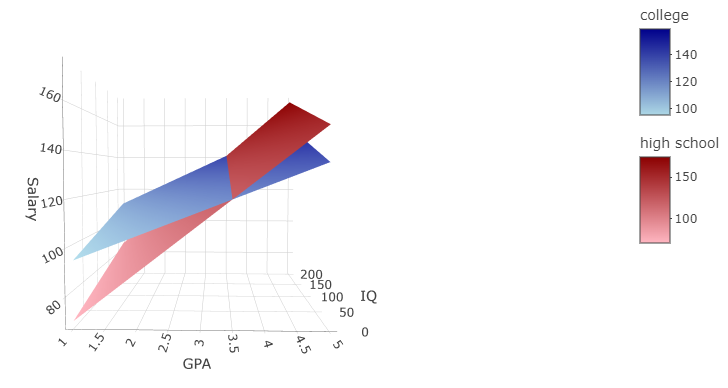 

结论是和前面数学表达式中获取的一致的

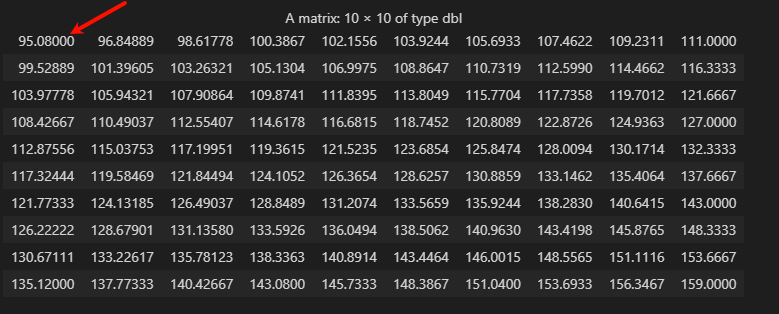

我们以第1位作为测试，也就是gpa是1，然后iq是23.11111的情况，对于college也就是大学生来说薪资是96.84,然后我们查看上面的矩阵的值：

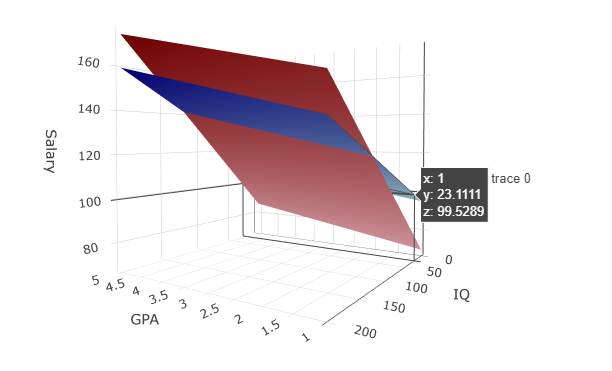	

发现实际上是有问题的，所以得在outer之后的数据中进行转置，或者是在add_surface中输入x以及y的值的时候，反过来定义

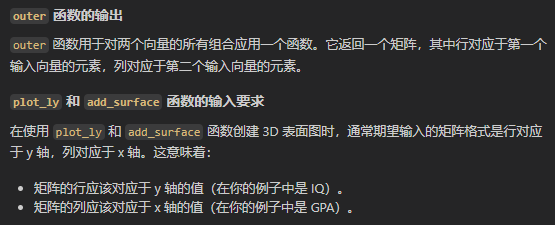

我们此处进行转置，然后结果确实就验证正确了

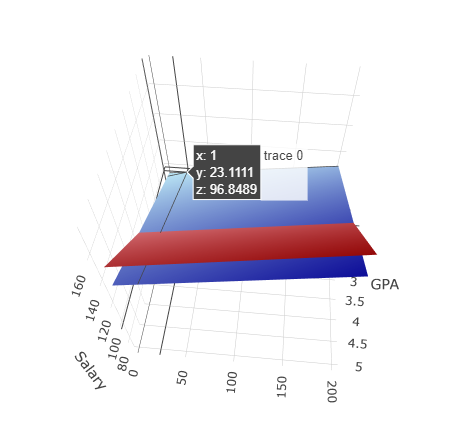

In [ ]:
# b
salary_model(GPA = 4.0,IQ = 110,LEVEL = 1)  # 预测大学学历的薪水，是137.1

[1] 137.1

In [ ]:
# c
# 对于交叉项的效应，我们同样可以通过lm函数来进行计算
# 就像前面实践lab中的那样，summary(lm(medv ~ lstat * age, data = Boston)) ，我们需要检验这个交叉项的显著值，我们才能判定这个交叉项是否对于模型的预测有重要的影响
# 所以这个问题是false！

4，

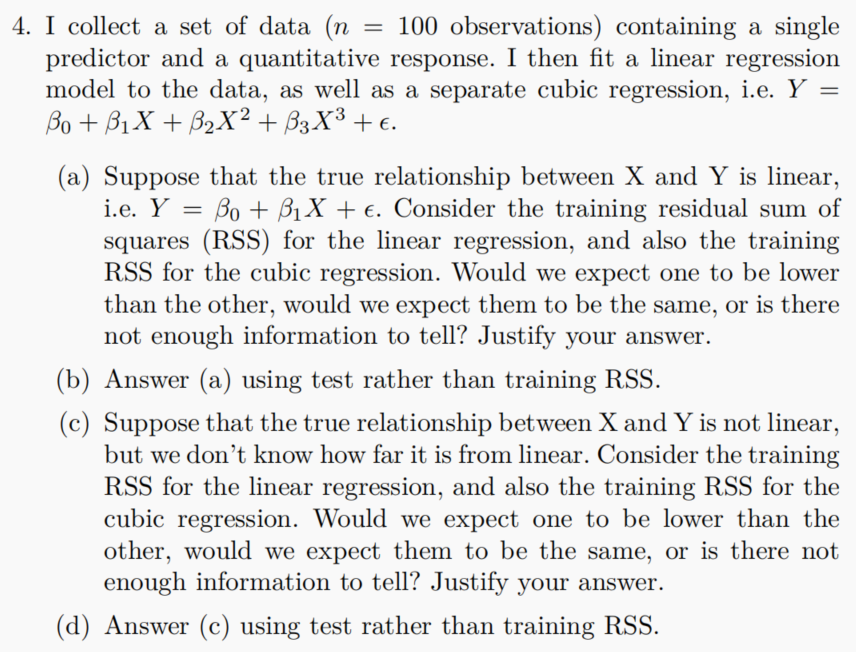

a

首先依据课件ppt上的说法：

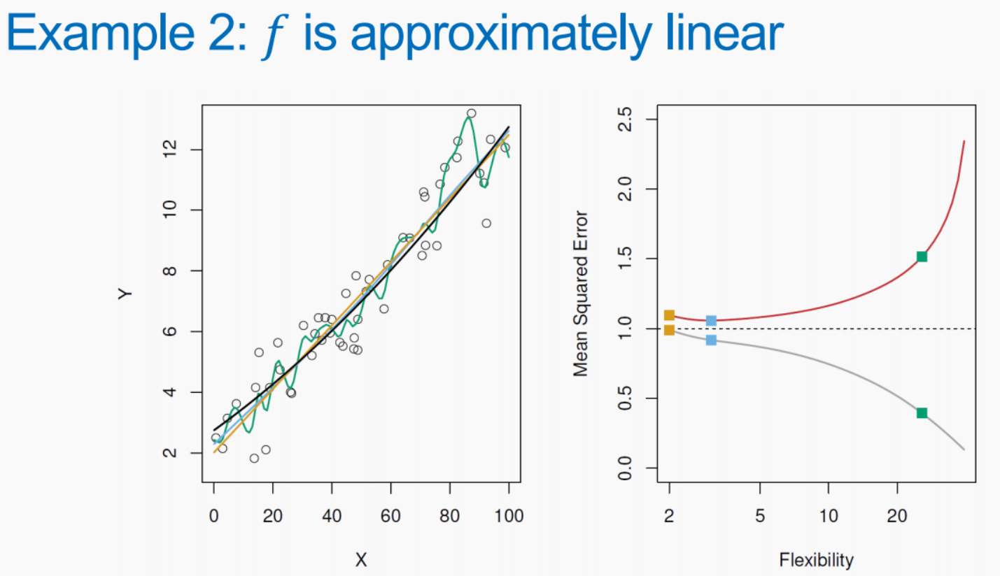  

In [ ]:
# 越灵活。参数越多的模型，其在训练集上的表现会越好，但是在测试集上的表现可能会越差，这就是过拟合的问题
# 所以立方项的模型拟合会比线性模型拟合具有更低的训练集的RSS，立方项的拟合只需要在高于一次项的项上的系数归0，就可以得到一个线性模型，总之就是更加灵活
# 所以立方项的模型拟合会比线性模型拟合具有更低的训练集的RSS

In [ ]:
# b
# 测试集部分的RSS，实际上会呈现出U形曲线，所以无法确定

# c
# 还是立方项的拟合模型会导致更低的训练集的RSS，道理和前面一样，因为训练集上拟合的话，立方项的模型永远比线性模型拟合得更好

# d
# 无法回答，因为到底Y和X之间的非线性或者线性关系如何无法确定

9，

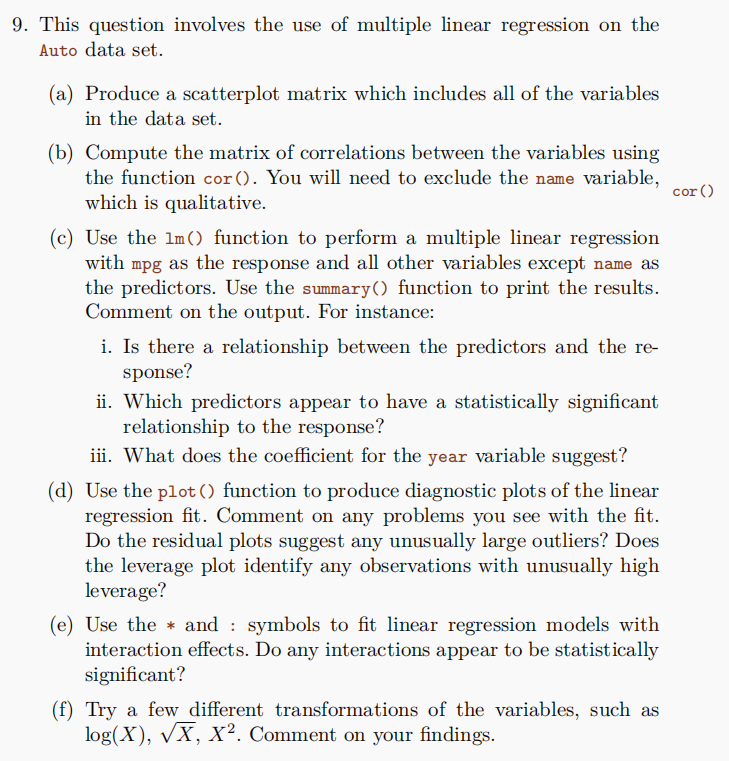

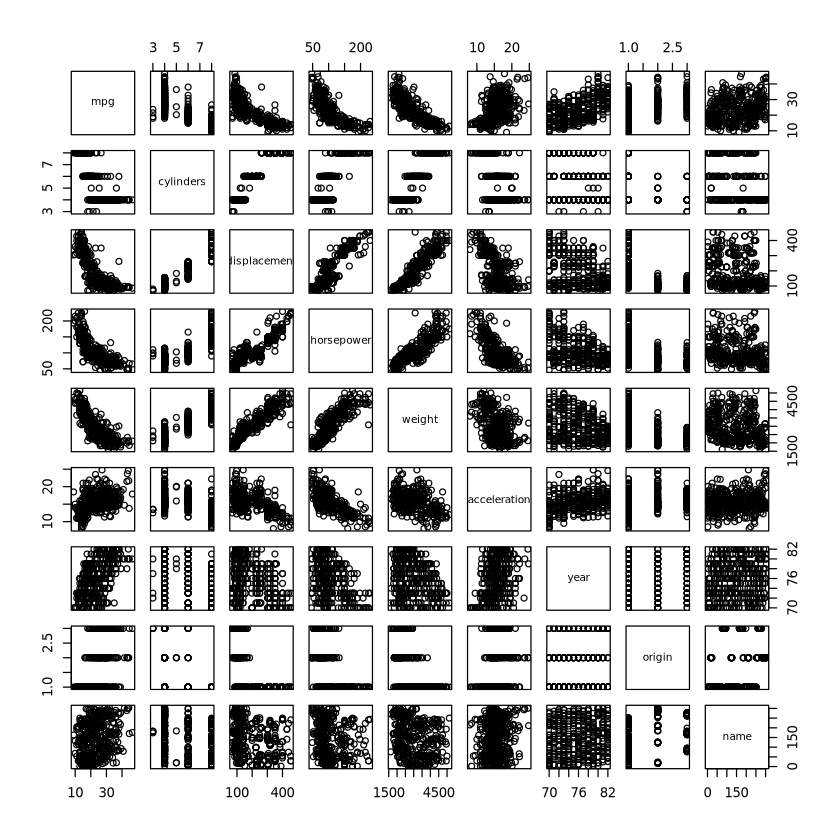

In [29]:
# a
library(ISLR2)
pairs(Auto) 

In [ ]:
# b

names(Auto)
# 'mpg''cylinders''displacement''horsepower''weight''acceleration''year''origin''name'
Auto %>% select(-name)%>%cor() # 去掉最后一列非数值变量列

[1] "mpg"          "cylinders"    "displacement" "horsepower"   "weight"      
[6] "acceleration" "year"         "origin"       "name"

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin
mpg,1.0000000,-0.7776175,-0.8051269,-0.7784268,-0.8322442,0.4233285,0.5805410,0.5652088
cylinders,-0.7776175,1.0000000,0.9508233,0.8429834,0.8975273,-0.5046834,-0.3456474,-0.5689316
displacement,-0.8051269,0.9508233,1.0000000,0.8972570,0.9329944,-0.5438005,-0.3698552,-0.6145351
horsepower,-0.7784268,0.8429834,0.8972570,1.0000000,0.8645377,-0.6891955,-0.4163615,-0.4551715
weight,-0.8322442,0.8975273,0.9329944,0.8645377,1.0000000,-0.4168392,-0.3091199,-0.5850054
acceleration,0.4233285,-0.5046834,-0.5438005,-0.6891955,-0.4168392,1.0000000,0.2903161,0.2127458
year,0.5805410,-0.3456474,-0.3698552,-0.4163615,-0.3091199,0.2903161,1.0000000,0.1815277
origin,0.5652088,-0.5689316,-0.6145351,-0.4551715,-0.5850054,0.2127458,0.1815277,1.0000000


In [ ]:
# c
lm.fit <- lm(mpg ~ . -name,data = Auto)
summary(lm.fit)


Call:
lm(formula = mpg ~ . - name, data = Auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-9.5903 -2.1565 -0.1169  1.8690 13.0604 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -17.218435   4.644294  -3.707  0.00024 ***
cylinders     -0.493376   0.323282  -1.526  0.12780    
displacement   0.019896   0.007515   2.647  0.00844 ** 
horsepower    -0.016951   0.013787  -1.230  0.21963    
weight        -0.006474   0.000652  -9.929  < 2e-16 ***
acceleration   0.080576   0.098845   0.815  0.41548    
year           0.750773   0.050973  14.729  < 2e-16 ***
origin         1.426141   0.278136   5.127 4.67e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.328 on 384 degrees of freedom
Multiple R-squared:  0.8215,	Adjusted R-squared:  0.8182 
F-statistic: 252.4 on 7 and 384 DF,  p-value: < 2.2e-16


In [ ]:
# 从上面我们可以很清楚地看到响应变量和预测变量之间的关系，从p值以及系数的估计值的正负综合来判断

# 有统计学显著性的是displacement、weight、year 、origin

# year的系数是正的，表明mpg平均每年增加0.750773（单位）

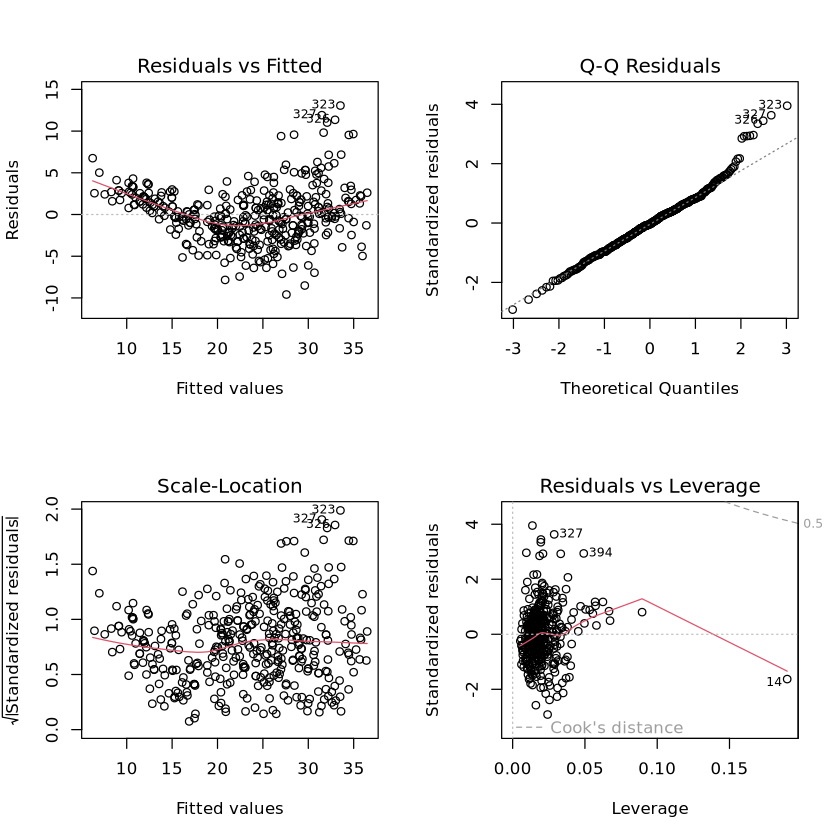

In [ ]:
# d
par(mfrow = c(2, 2))
plot(lm.fit) 


残差与拟合值图

残差在零线周围随机分布，这是一个好兆头。没有明显的模式或曲线表明关系中存在非线性。然而，有几个残差相对较大的点（正负都有），可能值得进一步调查。

残差的 Q-Q 图

Q-Q 图显示残差大致沿着对角线分布，表明它们大致呈正态分布。这是线性回归的许多统计检验的重要假设。在尾部有几个点稍微偏离直线，但这很常见，并不一定表明正态性严重违反。

尺度-位置图

尺度-位置图显示绝对标准化残差的平方根与拟合值的关系。红线大致平坦，表明残差的方差在拟合值范围内相对稳定。这被称为同方差性，是线性回归的另一个关键假设。在较高拟合值处方差有轻微增加，但并不明显。

残差与杠杆值图

此图有助于识别可能对回归模型产生不成比例影响的高杠杆点。大多数点落在典型范围内，但有几个点的杠杆值较高（大约在 0.15-0.20 之间）。这些点应进行检查，以确定它们是否对模型拟合产生过大影响。库克距离等高线（虚线）有助于识别对模型有较大影响的点；等高线内的点影响较小。

问题总结

拟合问题：总体来看，模型拟合良好，残差随机分布且大致呈正态分布。在较高拟合值处方差有轻微增加，但并不严重。

异常大的离群值：有几个残差 magnitude 较大的点，但没有特别异常的离群值。

高杠杆观测值：有几个观测值的杠杆值较高，但没有特别高。有必要检查这些点，以确保它们没有驱动模型结果。

In [39]:
# e

# 有7个预测变量，理论上来说，有C72 = 7!/(2! * 5!) = 21个两两相关的交叉项
# 加载必要的库
library(dplyr)

# 定义变量
variables <- c('cylinders', 'displacement', 'horsepower', 'weight', 'acceleration', 'year', 'origin')

# 生成所有两两变量组合的交叉项
combinations <- combn(variables, 2, simplify = FALSE)

# 循环遍历每个组合，拟合线性模型并输出摘要
for (combo in combinations) {
  interaction_term <- paste(combo, collapse = ":")
  formula <- as.formula(paste("mpg ~ . -name +", interaction_term))
  lm.fit <- lm(formula, data = Auto)
  cat("\n\n### Interaction Term:", interaction_term, "\n")
  print(summary(lm.fit))
}


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union






### Interaction Term: cylinders:displacement 

Call:
lm(formula = formula, data = Auto)

Residuals:
     Min       1Q   Median       3Q      Max 
-11.6081  -1.7833  -0.0465   1.6821  12.2617 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)            -2.7096590  4.6858582  -0.578 0.563426    
cylinders              -2.6962123  0.4094916  -6.584 1.51e-10 ***
displacement           -0.0774797  0.0141535  -5.474 7.96e-08 ***
horsepower             -0.0476026  0.0133736  -3.559 0.000418 ***
weight                 -0.0052339  0.0006253  -8.370 1.10e-15 ***
acceleration            0.0597997  0.0918038   0.651 0.515188    
year                    0.7594500  0.0473354  16.044  < 2e-16 ***
origin                  0.7087399  0.2736917   2.590 0.009976 ** 
cylinders:displacement  0.0136081  0.0017209   7.907 2.84e-14 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.089 on 383 degrees of freedom
Multip

In [ ]:
# 下面这种方法弃用！！！

# 定义变量
variables <- c('cylinders', 'displacement', 'horsepower', 'weight', 'acceleration', 'year', 'origin')

# 生成所有两两变量组合的交叉项
combinations <- combn(variables, 2, simplify = FALSE)

# 创建包含所有交叉项的公式
interaction_terms <- sapply(combinations, function(combo) paste(combo, collapse = ":"))
formula <- as.formula(paste("mpg ~ . -name +", paste(interaction_terms, collapse = " + ")))

# 拟合线性模型并输出摘要
lm.fit <- lm(formula, data = Auto)
summary(lm.fit)


Call:
lm(formula = formula, data = Auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.6303 -1.4481  0.0596  1.2739 11.1386 

Coefficients:
                            Estimate Std. Error t value Pr(>|t|)   
(Intercept)                3.548e+01  5.314e+01   0.668  0.50475   
cylinders                  6.989e+00  8.248e+00   0.847  0.39738   
displacement              -4.785e-01  1.894e-01  -2.527  0.01192 * 
horsepower                 5.034e-01  3.470e-01   1.451  0.14769   
weight                     4.133e-03  1.759e-02   0.235  0.81442   
acceleration              -5.859e+00  2.174e+00  -2.696  0.00735 **
year                       6.974e-01  6.097e-01   1.144  0.25340   
origin                    -2.090e+01  7.097e+00  -2.944  0.00345 **
cylinders:displacement    -3.383e-03  6.455e-03  -0.524  0.60051   
cylinders:horsepower       1.161e-02  2.420e-02   0.480  0.63157   
cylinders:weight           3.575e-04  8.955e-04   0.399  0.69000   
cylinders:acceleration     2.779e

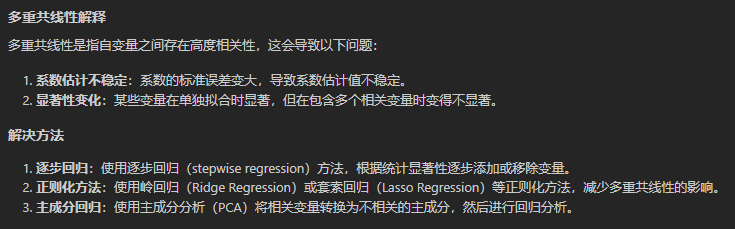

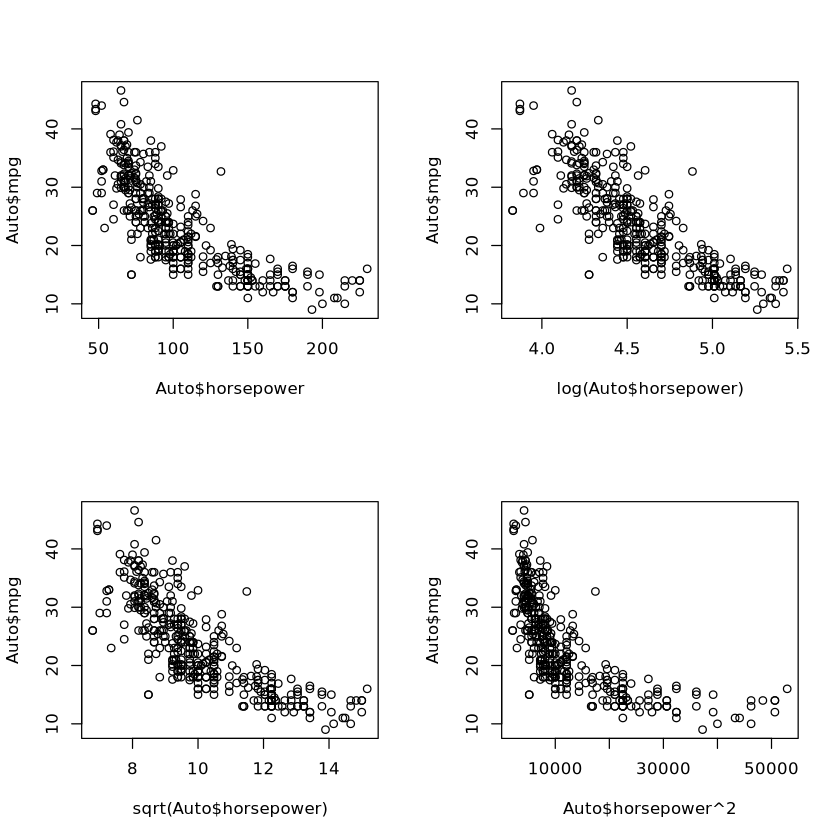

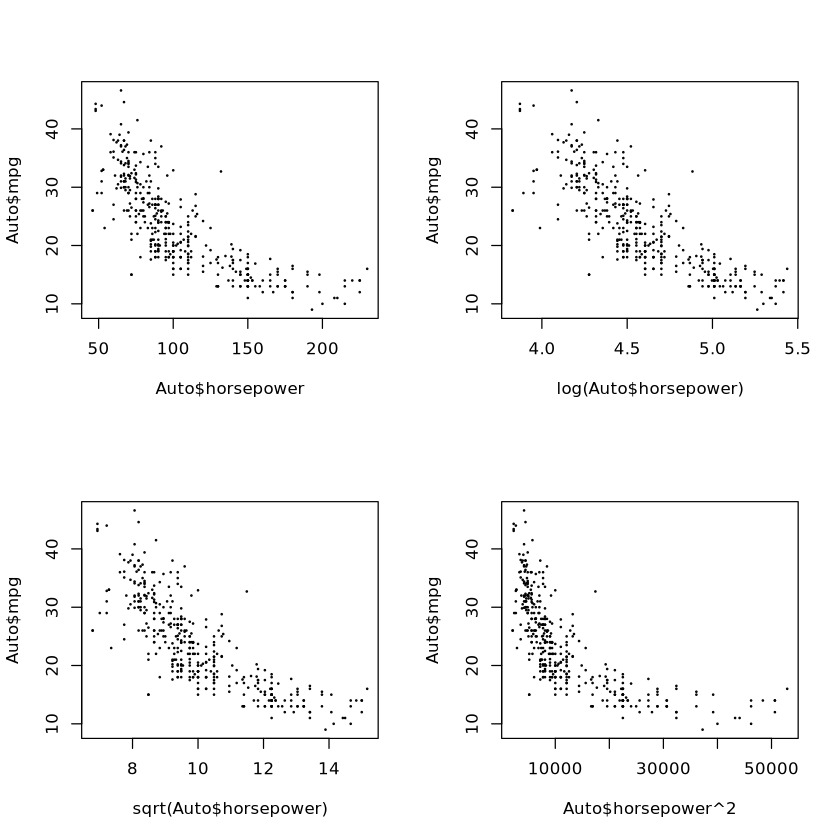

In [43]:
# f

# 此处我们以horsepower为例，进行非线性变换拟合

par(mfrow = c(2, 2))
plot(Auto$horsepower, Auto$mpg)
plot(log(Auto$horsepower), Auto$mpg)
plot(sqrt(Auto$horsepower), Auto$mpg)
plot(Auto$horsepower^2, Auto$mpg)

par(mfrow = c(2, 2))
plot(Auto$horsepower, Auto$mpg, cex = 0.2)
plot(log(Auto$horsepower), Auto$mpg, cex = 0.2)
plot(sqrt(Auto$horsepower), Auto$mpg, cex = 0.2)
plot(Auto$horsepower^2, Auto$mpg, cex = 0.2)

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<int>,<int>,<fct>
1,18,8,307,4.867534,3504,12.0,70,1,chevrolet chevelle malibu
2,15,8,350,5.105945,3693,11.5,70,1,buick skylark 320
3,18,8,318,5.010635,3436,11.0,70,1,plymouth satellite
4,16,8,304,5.010635,3433,12.0,70,1,amc rebel sst
5,17,8,302,4.941642,3449,10.5,70,1,ford torino
6,15,8,429,5.288267,4341,10.0,70,1,ford galaxie 500
7,14,8,454,5.393628,4354,9.0,70,1,chevrolet impala
8,14,8,440,5.370638,4312,8.5,70,1,plymouth fury iii
9,14,8,455,5.416100,4425,10.0,70,1,pontiac catalina



Call:
lm(formula = mpg ~ . - name, data = Auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-9.5903 -2.1565 -0.1169  1.8690 13.0604 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -17.218435   4.644294  -3.707  0.00024 ***
cylinders     -0.493376   0.323282  -1.526  0.12780    
displacement   0.019896   0.007515   2.647  0.00844 ** 
horsepower    -0.016951   0.013787  -1.230  0.21963    
weight        -0.006474   0.000652  -9.929  < 2e-16 ***
acceleration   0.080576   0.098845   0.815  0.41548    
year           0.750773   0.050973  14.729  < 2e-16 ***
origin         1.426141   0.278136   5.127 4.67e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.328 on 384 degrees of freedom
Multiple R-squared:  0.8215,	Adjusted R-squared:  0.8182 
F-statistic: 252.4 on 7 and 384 DF,  p-value: < 2.2e-16



Call:
lm(formula = mpg ~ . - name, data = Auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-9.3115 -2.0041 -0.1726  1.8393 12.6579 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  27.254005   8.589614   3.173  0.00163 ** 
cylinders    -0.486206   0.306692  -1.585  0.11372    
displacement  0.019456   0.006876   2.830  0.00491 ** 
horsepower   -9.506436   1.539619  -6.175 1.69e-09 ***
weight       -0.004266   0.000694  -6.148 1.97e-09 ***
acceleration -0.292088   0.103804  -2.814  0.00515 ** 
year          0.705329   0.048456  14.556  < 2e-16 ***
origin        1.482435   0.259347   5.716 2.19e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 3.18 on 384 degrees of freedom
Multiple R-squared:  0.837,	Adjusted R-squared:  0.834 
F-statistic: 281.6 on 7 and 384 DF,  p-value: < 2.2e-16


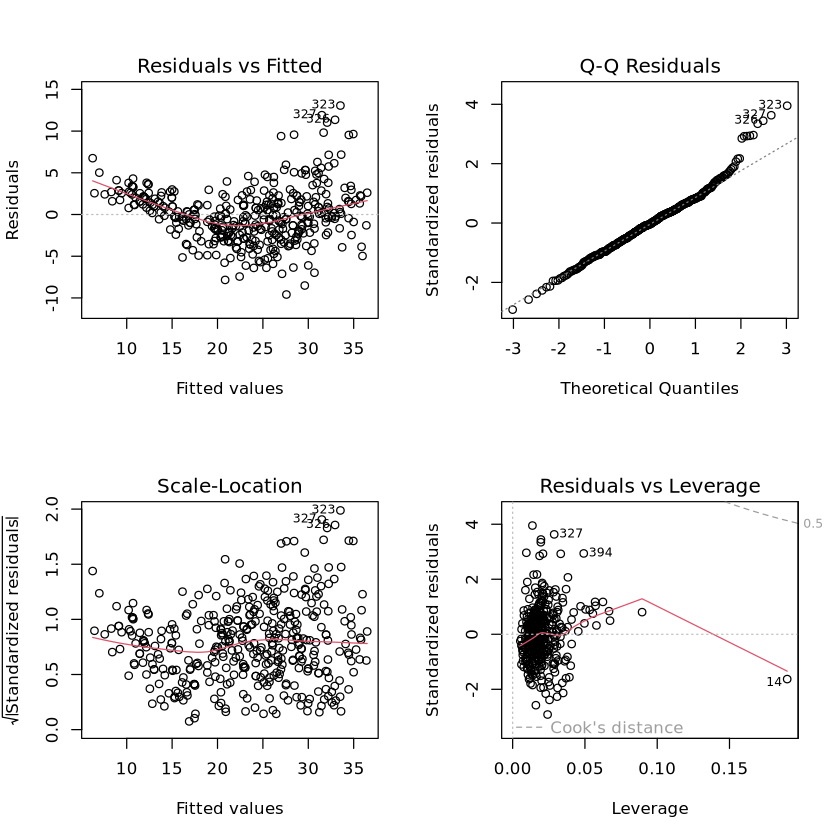

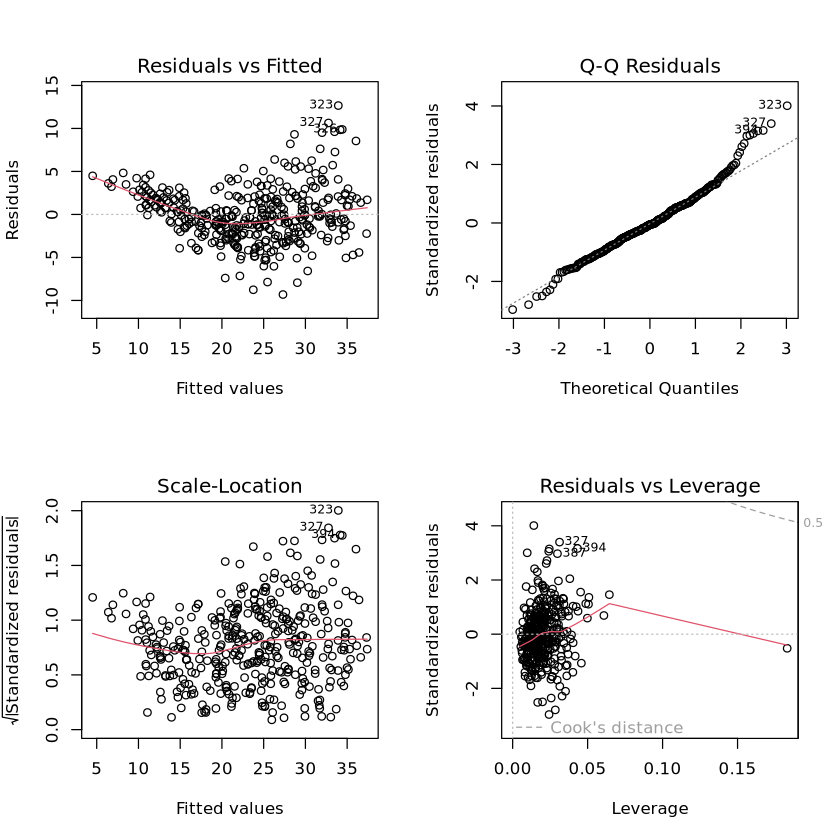

In [ ]:
# 此处我们仅以log转换为例

Auto %>% mutate(horsepower=log(horsepower))
fit.new <- lm(mpg ~ . -name,data = Auto)
summary(fit.new)
par(mfrow = c(2, 2))
plot(fit.new)

Auto <- Auto %>% mutate(horsepower=log(horsepower))
fit.new <- lm(mpg ~ . -name,data = Auto)
summary(fit.new)
par(mfrow = c(2, 2))
plot(fit.new)

In [ ]:
# 可以发现在log转变之后horsepower似乎与mpg更呈现线性关系了，并且p值更加显著了

13，

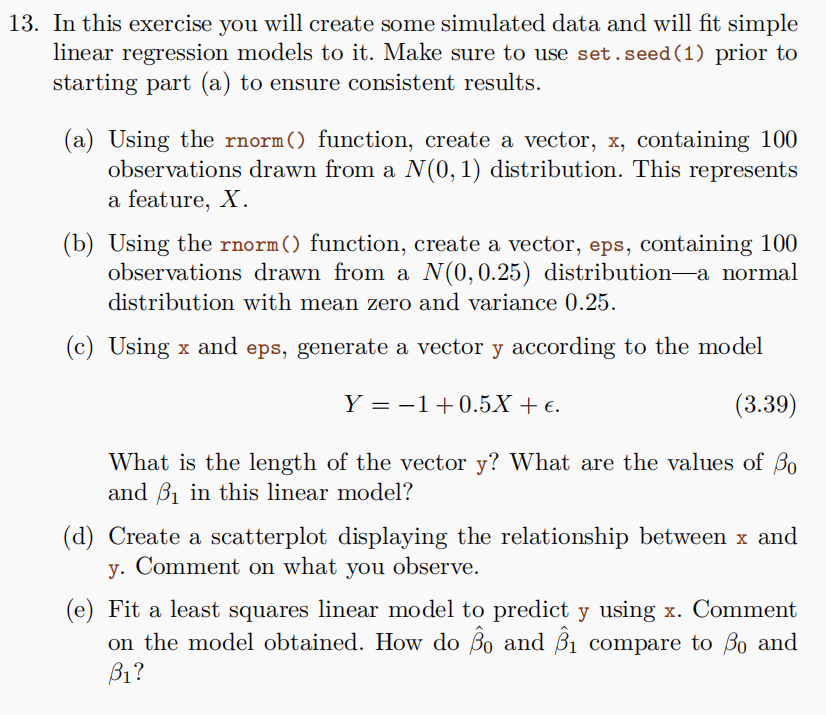

In [47]:
set.seed(1)

In [48]:
# a
X <- rnorm(n = 100,mean = 0,sd = 1)
print(X)

  [1] -0.626453811  0.183643324 -0.835628612  1.595280802  0.329507772
  [6] -0.820468384  0.487429052  0.738324705  0.575781352 -0.305388387
 [11]  1.511781168  0.389843236 -0.621240581 -2.214699887  1.124930918
 [16] -0.044933609 -0.016190263  0.943836211  0.821221195  0.593901321
 [21]  0.918977372  0.782136301  0.074564983 -1.989351696  0.619825748
 [26] -0.056128740 -0.155795507 -1.470752384 -0.478150055  0.417941560
 [31]  1.358679552 -0.102787727  0.387671612 -0.053805041 -1.377059557
 [36] -0.414994563 -0.394289954 -0.059313397  1.100025372  0.763175748
 [41] -0.164523596 -0.253361680  0.696963375  0.556663199 -0.688755695
 [46] -0.707495157  0.364581962  0.768532925 -0.112346212  0.881107726
 [51]  0.398105880 -0.612026393  0.341119691 -1.129363096  1.433023702
 [56]  1.980399899 -0.367221476 -1.044134626  0.569719627 -0.135054604
 [61]  2.401617761 -0.039240003  0.689739362  0.028002159 -0.743273209
 [66]  0.188792300 -1.804958629  1.465554862  0.153253338  2.172611670
 [71] 

In [50]:
# b
eps <- rnorm(n = 100,mean = 0,sd = sqrt(0.25)) # 注意这里是sd = sqrt(0.25)而不是0.25
print(eps)

  [1]  0.204700920  0.844436643  0.793294217 -0.165453900 -1.142617768
  [6]  1.248830795  0.333533083  0.270663668 -0.006699762  0.255054211
 [11] -0.082187916  0.210347322 -0.200123372 -0.685103939  0.493919134
 [16]  0.759872513 -0.154370285 -0.626644878  0.321120653 -0.022354568
 [21] -0.866609203  0.001065930 -0.315150167 -0.170484290 -0.578286181
 [26]  0.901570954 -0.165566018 -0.802756706  0.098596719  0.131587823
 [31] -0.492913350 -1.444460336 -0.320240851  0.285253818 -0.029861638
 [36] -0.049089372  0.280410364 -0.593229319  0.548388522 -0.002672014
 [41]  0.353655334  0.517053867  0.111740207 -0.439353806  0.581482278
 [46] -1.000082472 -0.272395370 -0.127835355 -0.083060518  0.510231954
 [51]  0.068110947  0.203583802 -0.034827407 -0.123832171  0.347775403
 [56]  0.573114179 -1.201548107  0.286369778  0.187362203 -0.212633861
 [61]  0.475506404 -0.194618591 -0.142165331  0.428704889  0.859813650
 [66]  0.135027450 -0.211092005 -0.594556647 -0.165516489 -0.469914663
 [71] 

In [ ]:
# c
Y <- -1 + 0.5 * X + eps
print(Y)
length(Y)  # 向量长100

  [1] -1.10852599 -0.06374169 -0.62452009 -0.36781350 -1.97786388 -0.16140340
  [7] -0.42275239 -0.36017398 -0.71880909 -0.89763998 -0.32629733 -0.59473106
 [13] -1.51074366 -2.79245388  0.05638459 -0.26259429 -1.16246542 -1.15472677
 [19] -0.26826875 -0.72540391 -1.40712052 -0.60786592 -1.27786768 -2.16516014
 [25] -1.26837331 -0.12649342 -1.24346377 -2.53813290 -1.14047831 -0.65944140
 [31] -0.81357357 -2.49585420 -1.12640505 -0.74164870 -1.71839142 -1.25658665
 [37] -0.91673461 -1.62288602  0.09840121 -0.62108414 -0.72860646 -0.60962697
 [43] -0.53977810 -1.16102221 -0.76289557 -2.35383005 -1.09010439 -0.74356889
 [49] -1.13923362 -0.04921418 -0.73283611 -1.10242939 -0.86426756 -1.68851372
 [55]  0.06428725  0.56331413 -2.38515885 -1.23569754 -0.52777798 -1.28016116
 [61]  0.67631528 -1.21423859 -0.79729565 -0.55729403 -0.51182295 -0.77057640
 [67] -2.11357132 -0.86177922 -1.08888982 -0.38360883 -0.89171153 -1.15778363
 [73] -1.12056537 -0.14246538 -1.54881086 -0.28917325 -2.3662079

[1] 100

In [ ]:
# 我们开始拟合模型
lm.fit <- lm(Y ~ X)
summary(lm.fit)

# (Intercept) -0.98632，对应的就是截距的估计值，X            0.51058，对应的就是斜率的估计值


Call:
lm(formula = Y ~ X)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.45706 -0.24115 -0.02266  0.32462  1.32079 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.98632    0.05235 -18.840  < 2e-16 ***
X            0.51058    0.05815   8.781 5.34e-14 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5197 on 98 degrees of freedom
Multiple R-squared:  0.4403,	Adjusted R-squared:  0.4346 
F-statistic:  77.1 on 1 and 98 DF,  p-value: 5.336e-14


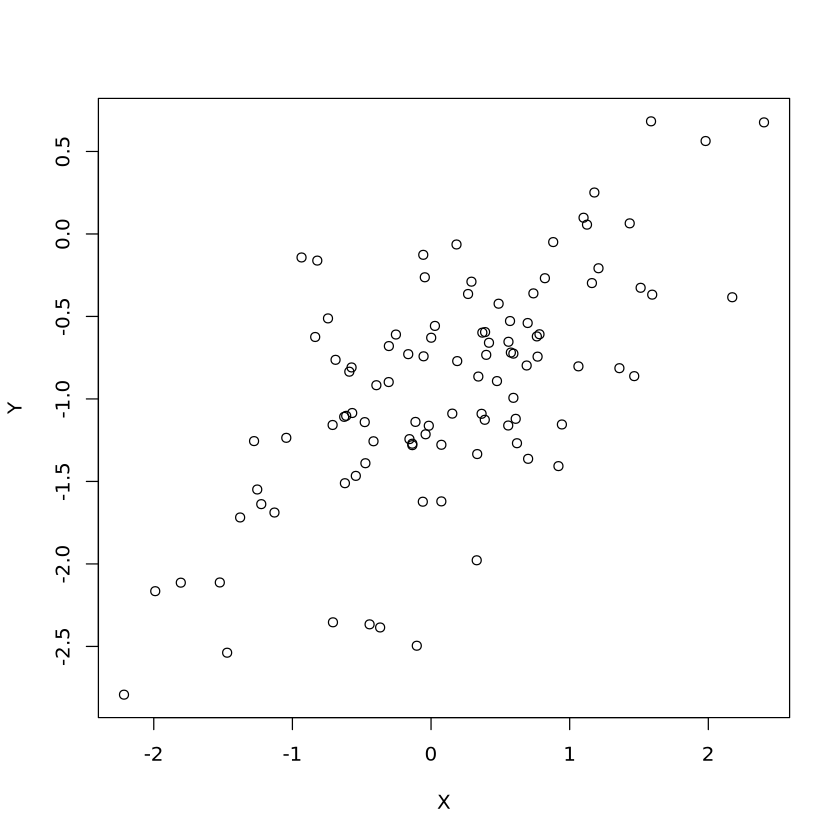

In [ ]:
# d

plot(X,Y)

# 从图上看起来，似乎是线性的

In [59]:
# e

# 我们开始拟合模型
lm.fit <- lm(Y ~ X)
summary(lm.fit)

# 看sd的话，两个系数拟合的挺好的
# 模型的系数估计值都非常显著，标准误较小，说明模型拟合良好。
# 截距项和 X 的系数都显著不为零，说明 X 对 y 有显著的线性影响。


Call:
lm(formula = Y ~ X)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.45706 -0.24115 -0.02266  0.32462  1.32079 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.98632    0.05235 -18.840  < 2e-16 ***
X            0.51058    0.05815   8.781 5.34e-14 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5197 on 98 degrees of freedom
Multiple R-squared:  0.4403,	Adjusted R-squared:  0.4346 
F-statistic:  77.1 on 1 and 98 DF,  p-value: 5.336e-14


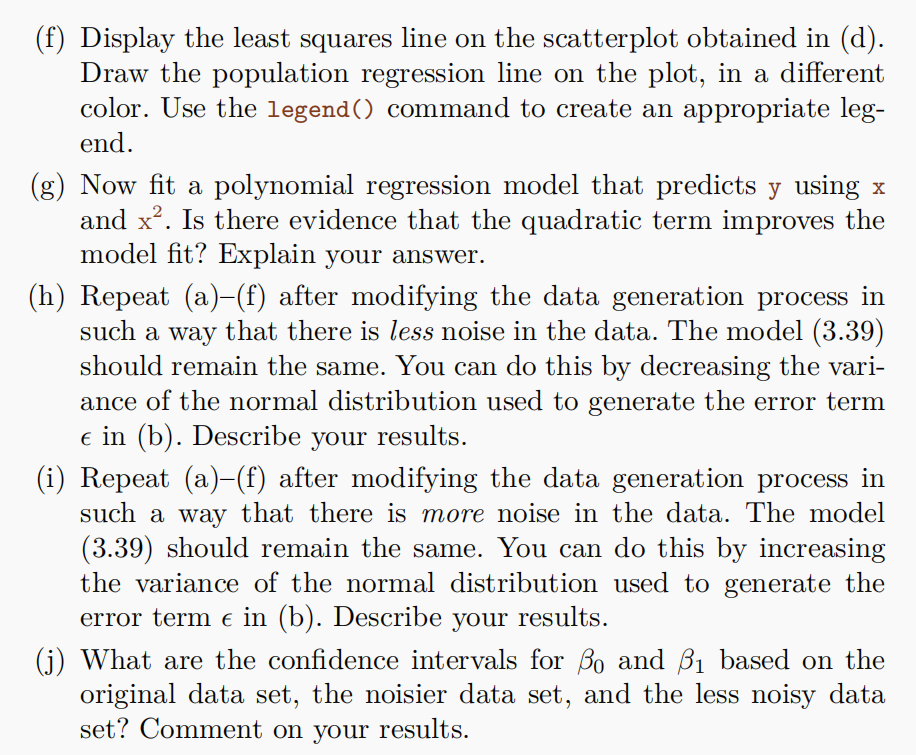

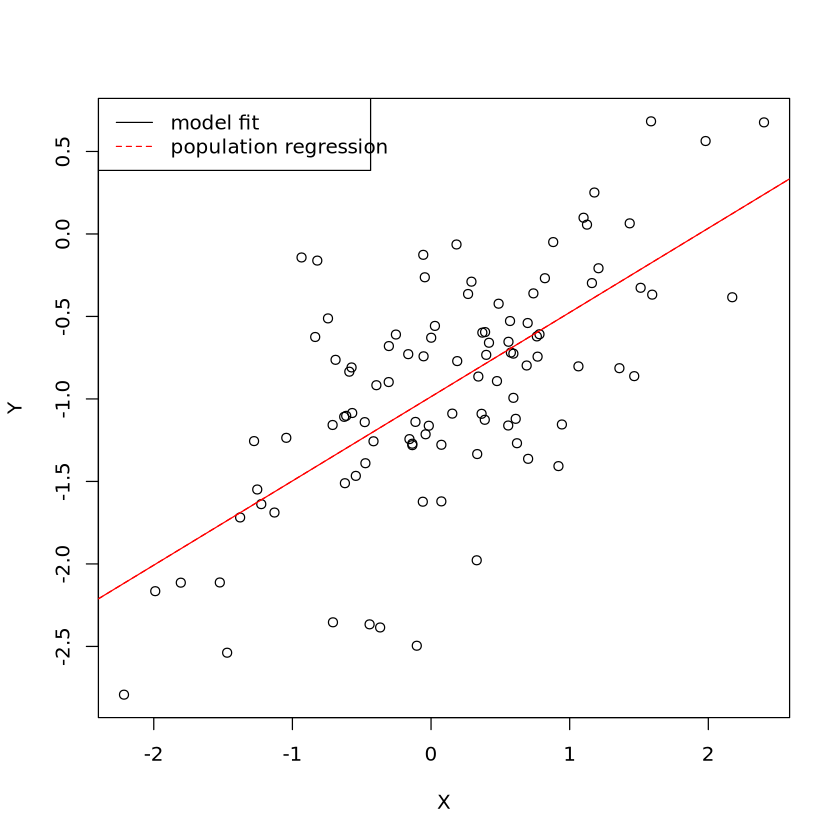

In [66]:
# f
plot(X, Y)
abline(lm.fit,col="red")

abline(-0.98632, 0.51058, col = "red", lty = 2)

legend("topleft",
  c("model fit", "population regression"),
  col = c("black", "red"),
  lty = c(1, 2)
)

In [ ]:
# g

lm.fit <- lm(Y ~ X)
summary(lm.fit)

fit.2 <- lm(Y ~ X + I(X^2))
summary(fit.2)

# 或者
fit.22 <- lm(Y ~ poly(X, 2,raw = TRUE))
summary(fit.22)

anova(fit.2,lm.fit)
anova(fit.22,lm.fit)

# F检验都不显著，说明模型的拟合效果并没有提升


Call:
lm(formula = Y ~ X)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.45706 -0.24115 -0.02266  0.32462  1.32079 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.98632    0.05235 -18.840  < 2e-16 ***
X            0.51058    0.05815   8.781 5.34e-14 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5197 on 98 degrees of freedom
Multiple R-squared:  0.4403,	Adjusted R-squared:  0.4346 
F-statistic:  77.1 on 1 and 98 DF,  p-value: 5.336e-14



Call:
lm(formula = Y ~ X + I(X^2))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.46371 -0.24761 -0.01792  0.32978  1.32271 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.979434   0.064138 -15.271  < 2e-16 ***
X            0.511912   0.058865   8.696 8.71e-14 ***
I(X^2)      -0.008668   0.046208  -0.188    0.852    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5223 on 97 degrees of freedom
Multiple R-squared:  0.4405,	Adjusted R-squared:  0.429 
F-statistic: 38.19 on 2 and 97 DF,  p-value: 5.856e-13



Call:
lm(formula = Y ~ poly(X, 2, raw = TRUE))

Residuals:
     Min       1Q   Median       3Q      Max 
-1.46371 -0.24761 -0.01792  0.32978  1.32271 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             -0.979434   0.064138 -15.271  < 2e-16 ***
poly(X, 2, raw = TRUE)1  0.511912   0.058865   8.696 8.71e-14 ***
poly(X, 2, raw = TRUE)2 -0.008668   0.046208  -0.188    0.852    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5223 on 97 degrees of freedom
Multiple R-squared:  0.4405,	Adjusted R-squared:  0.429 
F-statistic: 38.19 on 2 and 97 DF,  p-value: 5.856e-13


,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,97,26.45666,NA,NA,NA,NA
2,98,26.46626,-1,-0.009598243,0.03519075,0.8515884


,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,97,26.45666,NA,NA,NA,NA
2,98,26.46626,-1,-0.009598243,0.03519075,0.8515884



Call:
lm(formula = y ~ x)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.6547 -0.1600 -0.0127  0.1452  0.8618 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -1.00908    0.02631  -38.35   <2e-16 ***
x            0.50630    0.02663   19.01   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.2628 on 98 degrees of freedom
Multiple R-squared:  0.7867,	Adjusted R-squared:  0.7845 
F-statistic: 361.4 on 1 and 98 DF,  p-value: < 2.2e-16


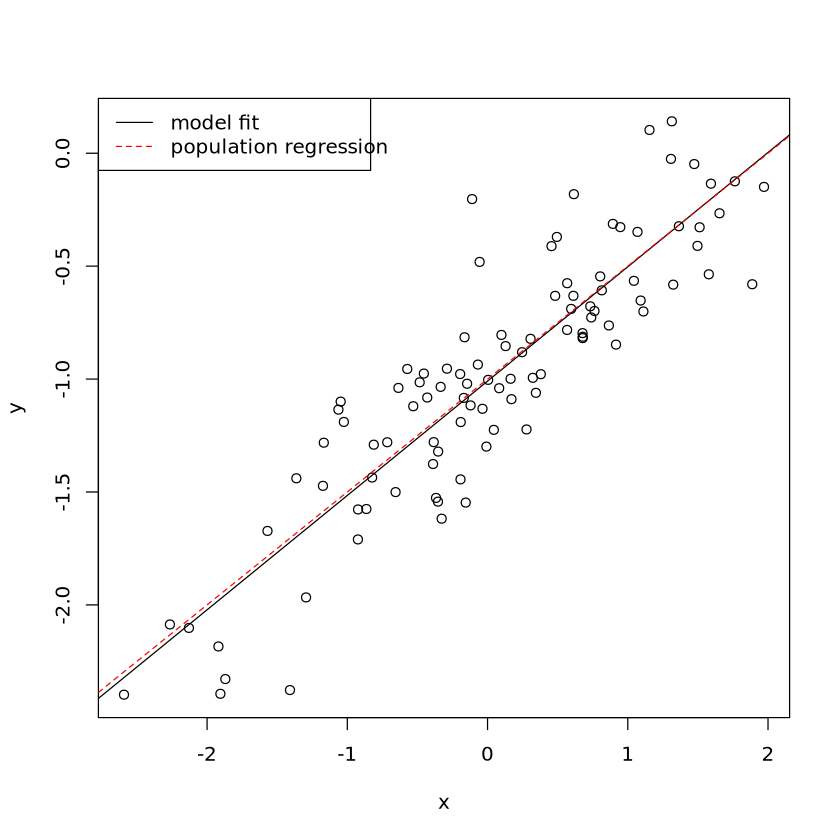

In [ ]:
# h

# 比如说我们拟合方差为0.05的误差的模型

x <- rnorm(100, 0, 1)
y <- -1 + 0.5 * x + rnorm(100, 0, sqrt(0.05))
fit2 <- lm(y ~ x)
summary(fit2)
plot(x, y)
abline(fit2)
abline(-1, 0.5, col = "red", lty = 2)
legend("topleft",
  c("model fit", "population regression"),
  col = c("black", "red"),
  lty = c(1, 2)
)

# 可以看出，数据变异性减小，R2变高了


Call:
lm(formula = y ~ x)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.73419 -0.80105 -0.05787  0.74623  2.87841 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -1.1992     0.1087 -11.027  < 2e-16 ***
x             0.5086     0.1130   4.501 1.87e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.086 on 98 degrees of freedom
Multiple R-squared:  0.1713,	Adjusted R-squared:  0.1628 
F-statistic: 20.26 on 1 and 98 DF,  p-value: 1.866e-05


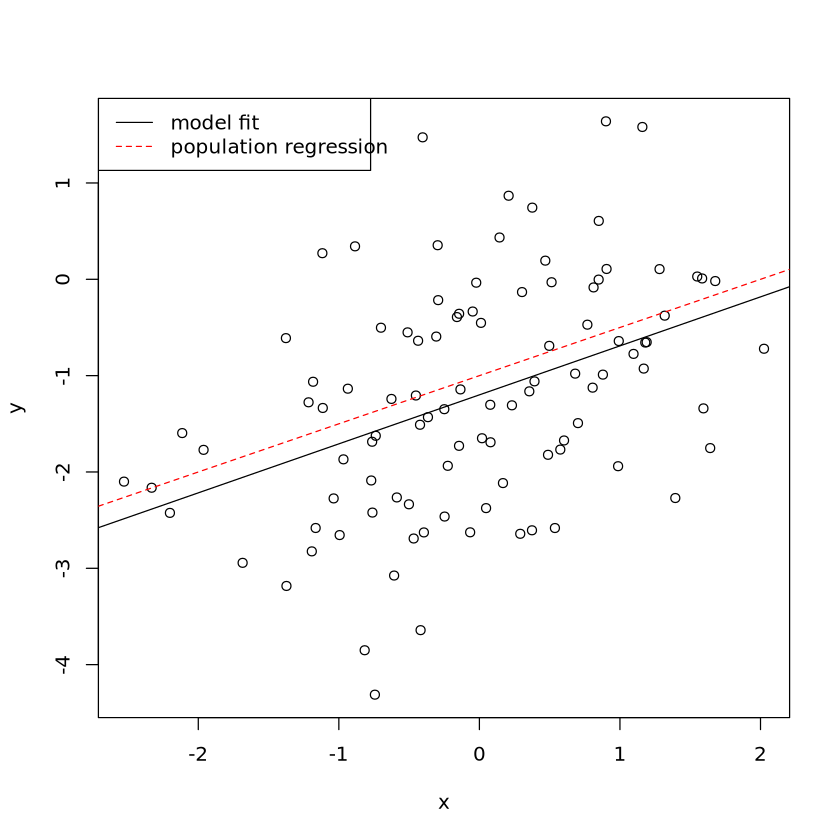

In [ ]:
# i

# 噪声越高，我们就拟合1

x <- rnorm(100, 0, 1)
y <- -1 + 0.5 * x + rnorm(100, 0, 1)
fit3 <- lm(y ~ x)
summary(fit3)
plot(x, y)
abline(fit3)
abline(-1, 0.5, col = "red", lty = 2)
legend("topleft",
  c("model fit", "population regression"),
  col = c("black", "red"),
  lty = c(1, 2)
)

# 可以看出，数据变异性增大，R2变低了

In [ ]:
# j
confint(lm.fit)
confint(fit2)
confint(fit3)

# 误差越小，置信区间越小

,2.5 %,97.5 %
(Intercept),-1.0902064,-0.8824249
X,0.3951885,0.6259784


,2.5 %,97.5 %
(Intercept),-1.0612967,-0.9568549
x,0.4534481,0.5591528


,2.5 %,97.5 %
(Intercept),-1.4150018,-0.9833927
x,0.2843477,0.7328345
